## Import Libraries

In [1]:
import pandas as pd 
import numpy as np 
import plotly.express as px 
import plotly.graph_objects as go 
import plotly.figure_factory as ff
import seaborn as sns

In [2]:
import warnings
#Suppress FutureWarning messages
warnings.simplefilter(action='ignore', category=FutureWarning)

## Load Data

In [3]:
df = pd.read_csv('Cleaned-marketing.csv')
df

,id,education,marital_status,income$,kidhome,teenhome,mntwines,mntfruits,mntmeatproducts,mntfishproducts,...,year,month,month_name,day,day_name,quarter,weekday,week_categories,season,days_of_purchases
0,1826,Graduation,Divorced,84835.0,0,0,189.0,104.0,379.0,111.0,...,2014,6,June,16,Monday,2,0,WorkDay,Summer,Top Sellers
1,1,Graduation,Single,57091.0,0,0,464.0,5.0,64.0,7.0,...,2014,6,June,15,Sunday,2,6,WeekEnd,Summer,Top Sellers
2,10476,Graduation,Married,67267.0,0,1,134.0,11.0,59.0,15.0,...,2014,5,May,13,Tuesday,2,1,WorkDay,Spring,Top Sellers
3,1386,Graduation,Together,32474.0,1,1,10.0,0.0,1.0,0.0,...,2014,5,May,11,Sunday,2,6,WeekEnd,Spring,Top Sellers
4,5371,Graduation,Single,21474.0,1,0,6.0,16.0,24.0,11.0,...,2014,4,April,8,Tuesday,2,1,WorkDay,Spring,Top Sellers
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2231,10142,PhD,Divorced,66476.0,0,1,372.0,18.0,126.0,47.0,...,2013,3,March,7,Thursday,1,3,WorkDay,Spring,Very Old
2232,5263,2n Cycle,Married,31056.0,1,0,5.0,10.0,13.0,3.0,...,2013,1,January,22,Tuesday,1,1,WorkDay,Winter,Very Old
2233,22,Graduation,Divorced,46310.0,1,0,185.0,2.0,88.0,15.0,...,2012,12,December,3,Monday,4,0,WorkDay,Winter,Very Old
2234,528,Graduation,Married,65819.0,0,0,267.0,38.0,701.0,149.0,...,2012,11,November,29,Thursday,4,3,WorkDay,Fall,Very Old


## Bivariate Analysis

### 1.What are the Average income for our Customers by Their Marital Status?

In [4]:
average_income_by_marital_status = df.groupby('marital_status')['income$'].mean().reset_index().round(0).sort_values(by='income$',ascending = False)
average_income_by_marital_status

,marital_status,income$
5,Widow,56482.0
2,Other,54088.0
4,Together,53193.0
0,Divorced,52904.0
1,Married,51725.0
3,Single,50976.0


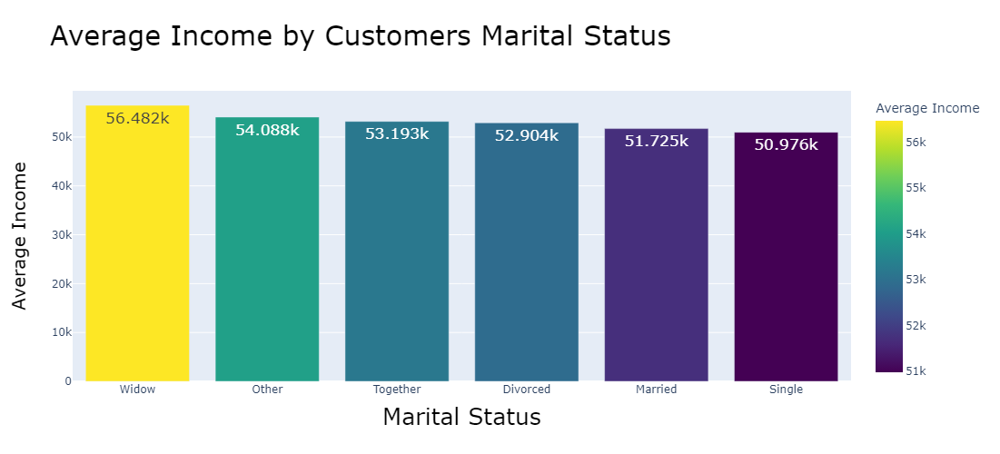

In [5]:
fig = px.bar(data_frame=average_income_by_marital_status,x='marital_status',y='income$',title='Average Income by Customers Marital Status',
             labels={'marital_status': 'Marital Status', 'income$': 'Average Income'},height=500,width=900,color='income$',
             color_continuous_scale=px.colors.sequential.Viridis,text_auto=True )
fig.update_traces(textfont_size=17)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),
                  yaxis_title_font=dict(size=20, color='black'))
fig.show()

### 2. What are the average Annual income for Customers by Their Ages?

In [6]:
def age_group(age):
    
    if 20<age<=30 :
        return "20-30"
    elif 31<=age<=40 :
        return "31-40"
    elif 41<=age<=50:
        return "41-50"
    elif 51<=age<=60:
        return "51-60"
    elif 61<=age<=70:
        return "61-70"
    elif 71<=age<=80:
        return "71-80"
    elif 81<=age<=90:
        return "81-90"
    elif 91<=age<=100:
        return "91-100"
    else:
        return "age>100"

In [7]:
df['grouped_age']=df['age'].apply(age_group)

In [8]:
average_income_by_age = df.groupby('grouped_age')['income$'].mean().reset_index().round(0).sort_values(by='income$',ascending = True)

In [9]:
average_income_by_age

,grouped_age,income$
1,31-40,44707.0
2,41-50,49777.0
3,51-60,51446.0
4,61-70,56432.0
0,20-30,58295.0
5,71-80,58823.0
6,81-90,64764.0


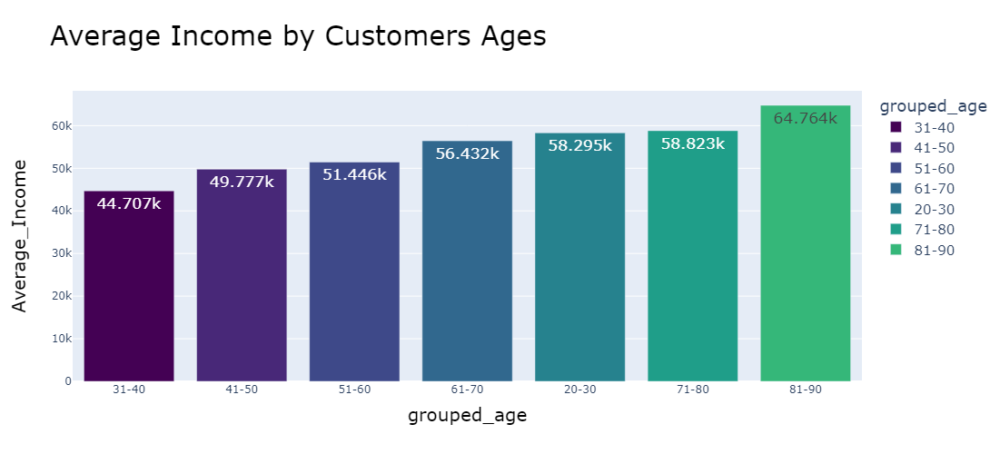

In [10]:
fig = px.bar(data_frame=average_income_by_age,x='grouped_age',y='income$',title='Average Income by Customers Ages',
             labels={'age': 'Grouped_Age', 'income$': 'Average_Income'},height=500,width=900,color='grouped_age',
             color_discrete_sequence=px.colors.sequential.Viridis,text_auto=True)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=20, color='black'),
                  yaxis_title_font=dict(size=20, color='black'))
fig.update_traces(textfont_size=17)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=20, color='black'),
                  yaxis_title_font=dict(size=20, color='black'),legend=dict(font=dict(size=15)))
fig.show()

### 3. What are the Top 10 Average Income by Their Ages and Marital_Status?

In [11]:
top_10_Avg_incomes= df.groupby(['marital_status', 'grouped_age'])['income$'].mean().reset_index().round(0).sort_values(by="income$",ascending = False).head(10)

In [12]:
top_10_Avg_incomes

,marital_status,grouped_age,income$
23,Together,20-30,80410.0
12,Married,81-90,77988.0
16,Single,20-30,66702.0
22,Single,81-90,64370.0
15,Other,61-70,63409.0
32,Widow,71-80,62237.0
11,Married,71-80,60757.0
21,Single,71-80,60457.0
20,Single,61-70,57777.0
33,Widow,81-90,57513.0


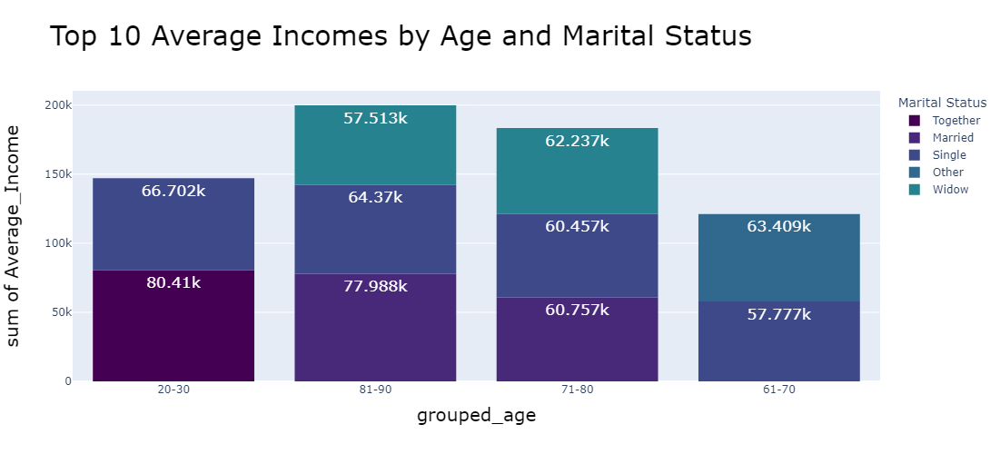

In [13]:
viridis_colors = px.colors.sequential.Viridis
fig = px.histogram(data_frame=top_10_Avg_incomes,x='grouped_age',y='income$',color='marital_status',title='Top 10 Average Incomes by Age and Marital Status',
    labels={'age': 'Grouped_Age', 'income$': 'Average_Income', 'marital_status': 'Marital Status'},height=500,width=900,
    color_discrete_sequence=viridis_colors,text_auto=True,)
fig.update_traces(textfont_size=17)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=20, color='black'),
                  yaxis_title_font=dict(size=20, color='black'))
fig.show()

### 4. What are the Least 10 Average Income by Their Ages and Marital_Status?

In [14]:
Least_10_Avg_incomes= df.groupby(['marital_status', 'grouped_age'])['income$'].mean().reset_index().round(0).sort_values(by="income$",ascending = True).head(10)
Least_10_Avg_incomes

,marital_status,grouped_age,income$
6,Married,20-30,10960.0
14,Other,51-60,42146.0
7,Married,31-40,43086.0
0,Divorced,31-40,43139.0
24,Together,31-40,45198.0
17,Single,31-40,46031.0
8,Married,41-50,47477.0
19,Single,51-60,47994.0
18,Single,41-50,48928.0
5,Divorced,81-90,48948.0


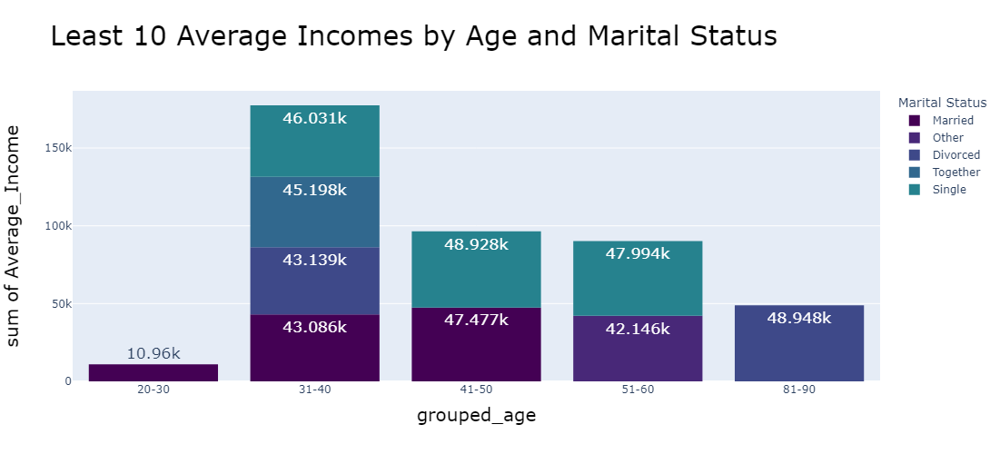

In [15]:
viridis_colors = px.colors.sequential.Viridis
fig = px.histogram(data_frame=Least_10_Avg_incomes,x='grouped_age',y='income$',color='marital_status',title='Least 10 Average Incomes by Age and Marital Status',
    labels={'age': 'Age', 'income$': 'Average_Income', 'marital_status': 'Marital Status'},height=500,width=900,
                   color_discrete_sequence=viridis_colors,text_auto=True,)
fig.update_traces(textfont_size=17)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=20, color='black'),
                  yaxis_title_font=dict(size=20, color='black'))
fig.show()

### 5. What are the average Income for our Customer Education?

In [16]:
sorted_df = df.groupby('education')['income$'].mean().reset_index().round(0).sort_values(by='income$',ascending = False)

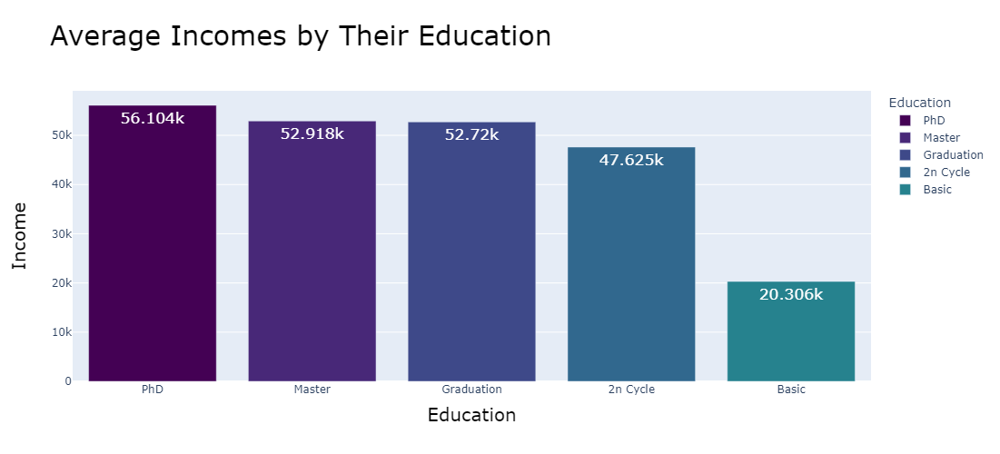

In [17]:
viridis_colors = px.colors.sequential.Viridis
fig = px.bar(data_frame=sorted_df,x='education',y='income$',color='education',title=' Average Incomes by Their Education',
    labels={'income$': 'Income', 'education': 'Education'},height=500,width=900,
    color_discrete_sequence=viridis_colors,text_auto=True)
fig.update_traces(textfont_size=17)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=20, color='black'),
                  yaxis_title_font=dict(size=20, color='black'))
fig.show()

### 6.What are the Proportions of Average Incomes with Their Kidhome?

In [18]:
avg_income_kidhome = df.groupby('kidhome')['income$'].mean().reset_index().round(0).sort_values(by='income$',ascending = False)
avg_income_kidhome['kidhome']=avg_income_kidhome['kidhome'].astype(str)
avg_income_kidhome

,kidhome,income$
0,0,61775.0
2,2,39150.0
1,1,39141.0


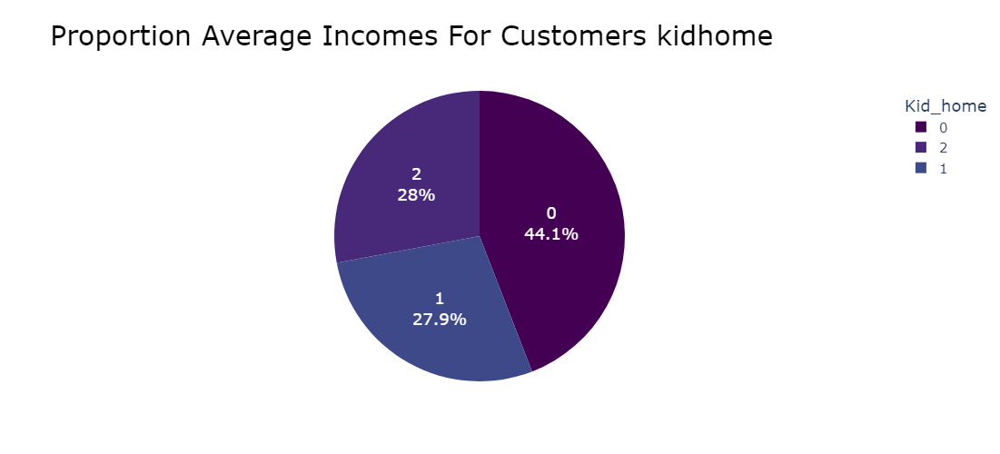

In [19]:
viridis_colors = px.colors.sequential.Viridis
fig =px.pie(data_frame=avg_income_kidhome , names='kidhome' ,values='income$',
       color_discrete_sequence=viridis_colors,title='Proportion Average Incomes For Customers kidhome',
       color='kidhome',labels={'income$': 'Income', 'kidhome': 'Kidhome'},height=500,width=900)
fig.update_traces(textinfo='label+percent', textfont=dict(size=18))
fig.update_layout(title_font=dict(size=30, color='black'),legend_title='Kid_home')
fig.update_layout(legend=dict(font=dict(size=15)))
fig.show()

### 7.What are the Average Income for our Customers by Their kidhome Numbers?

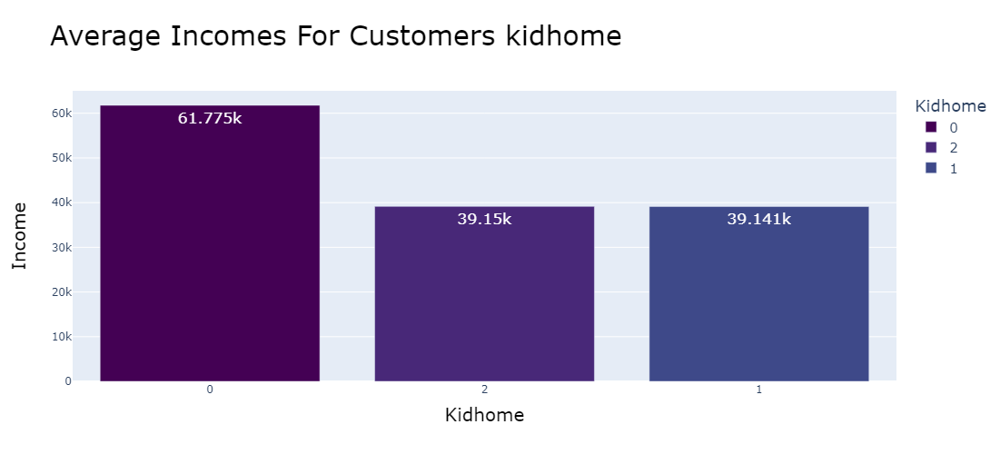

In [20]:
viridis_colors = px.colors.sequential.Viridis
fig = px.bar(data_frame=avg_income_kidhome,x='kidhome',y='income$',color='kidhome',title=' Average Incomes For Customers kidhome',
    labels={'income$': 'Income', 'kidhome': 'Kidhome'},height=500,width=900,
    color_discrete_sequence=viridis_colors,text_auto=True)
fig.update_traces(textfont_size=17)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=20, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))
fig.show()

### 8.What are the Proportions of Average Incomes with Their Teenhome?

In [21]:
avg_income_teenhome = df.groupby('teenhome')['income$'].mean().reset_index().round(0).sort_values(by='income$',ascending = False)
avg_income_teenhome['teenhome']=avg_income_teenhome['teenhome'].astype(str)
avg_income_teenhome

,teenhome,income$
2,2,55559.0
1,1,52482.0
0,0,51874.0


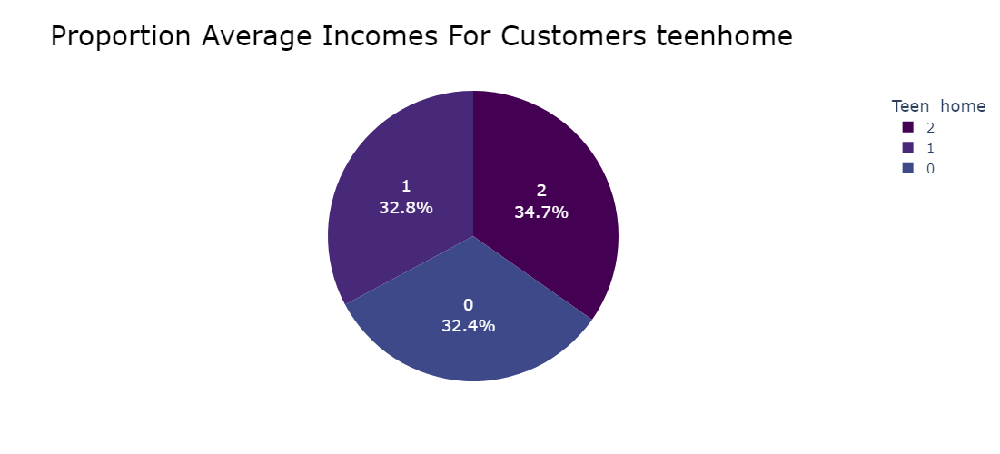

In [22]:
viridis_colors = px.colors.sequential.Viridis
fig =px.pie(data_frame=avg_income_teenhome , names='teenhome' ,values='income$',
       color_discrete_sequence=viridis_colors,title='Proportion Average Incomes For Customers teenhome',
       color='teenhome',labels={'income$': 'Income', 'teenhome': 'Teenhome'},height=500,width=900)
fig.update_traces(textinfo='label+percent', textfont=dict(size=18))
fig.update_layout(title_font=dict(size=30, color='black'),legend_title='Teen_home')
fig.update_layout(legend=dict(font=dict(size=15)))
fig.show()

### 9.What are the Average Income for our Customers by Their kidhome Numbers?

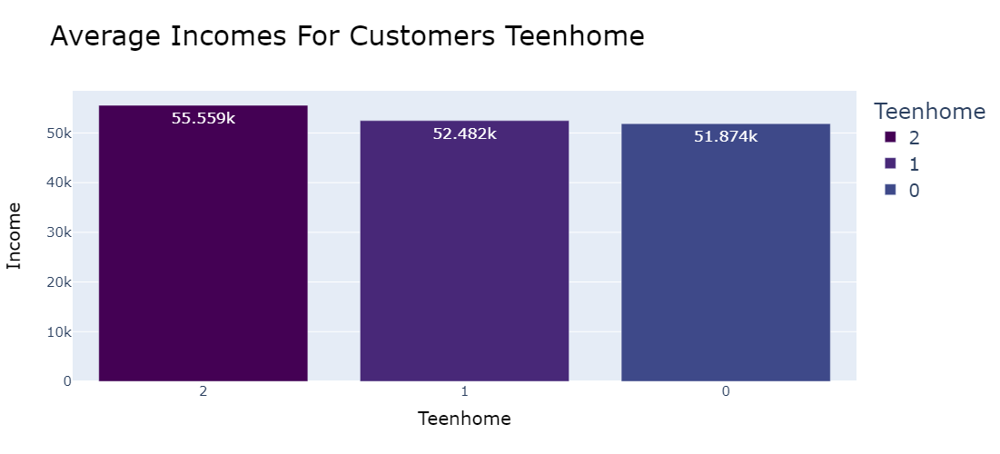

In [23]:
viridis_colors = px.colors.sequential.Viridis
fig = px.bar(data_frame=avg_income_teenhome,x='teenhome',y='income$',color='teenhome',title=' Average Incomes For Customers Teenhome',
    labels={'income$': 'Income', 'teenhome': 'Teenhome'},height=500,width=900,
    color_discrete_sequence=viridis_colors,text_auto=True)
fig.update_traces(textfont_size=17)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=20, color='black'),
                  yaxis_title_font=dict(size=20, color='black'),legend=dict(font=dict(size=20)),
                  yaxis=dict(tickfont=dict(size=15)),xaxis=dict(tickfont=dict(size=15)))

fig.show()

### 10.What are the average of Customer's income over Years?

In [24]:
avg_yearly_income = df.groupby('year')['income$'].mean().reset_index().round(0).sort_values(by='income$',ascending = False)
avg_yearly_income['year']=avg_yearly_income['year'].astype(str)
avg_yearly_income

,year,income$
2,2014,52814.0
1,2013,52419.0
0,2012,51156.0


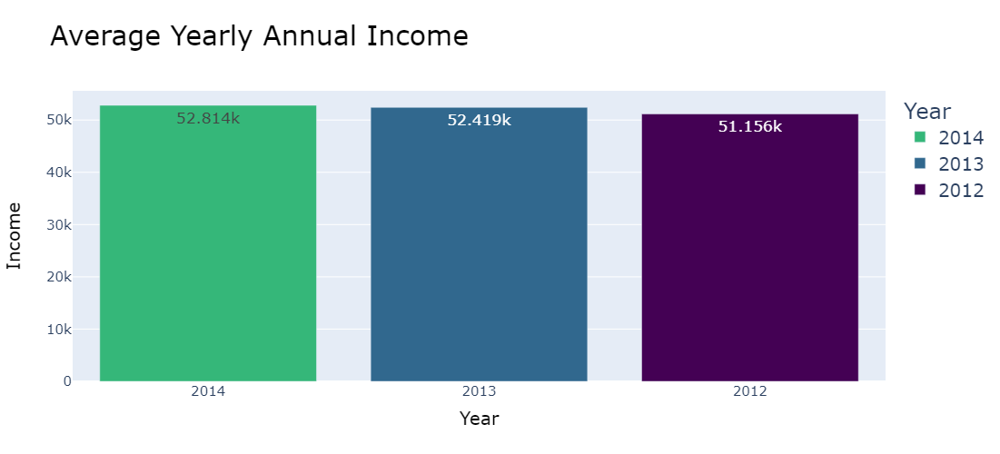

In [25]:
viridis_colors = px.colors.sequential.Viridis
selected_colors = [viridis_colors[0], viridis_colors[3], viridis_colors[6]]
color_discrete_map = {
    "2012": selected_colors[0],
    "2013": selected_colors[1],
    "2014": selected_colors[2]
}
fig = px.bar(data_frame=avg_yearly_income,x='year',y='income$',color='year',title=' Average Yearly Annual Income',
    labels={'income$': 'Income', 'year': 'Year'},height=500,width=900,
    color_discrete_map=color_discrete_map,text_auto=True)
fig.update_traces(textfont_size=17)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=20, color='black'),
                  yaxis_title_font=dict(size=20, color='black'),legend=dict(font=dict(size=20)),
                  yaxis=dict(tickfont=dict(size=15)),xaxis=dict(tickfont=dict(size=15)))

fig.show()

### 10. What are the Marital_status for each Education level of our Customers?

In [26]:
counting_customers = df.groupby(['marital_status','education']).size().reset_index(name='count_of_customers')
counting_customers

,marital_status,education,count_of_customers
0,Divorced,2n Cycle,22
1,Divorced,Basic,1
2,Divorced,Graduation,119
3,Divorced,Master,37
4,Divorced,PhD,52
5,Married,2n Cycle,81
6,Married,Basic,20
7,Married,Graduation,433
8,Married,Master,138
9,Married,PhD,192


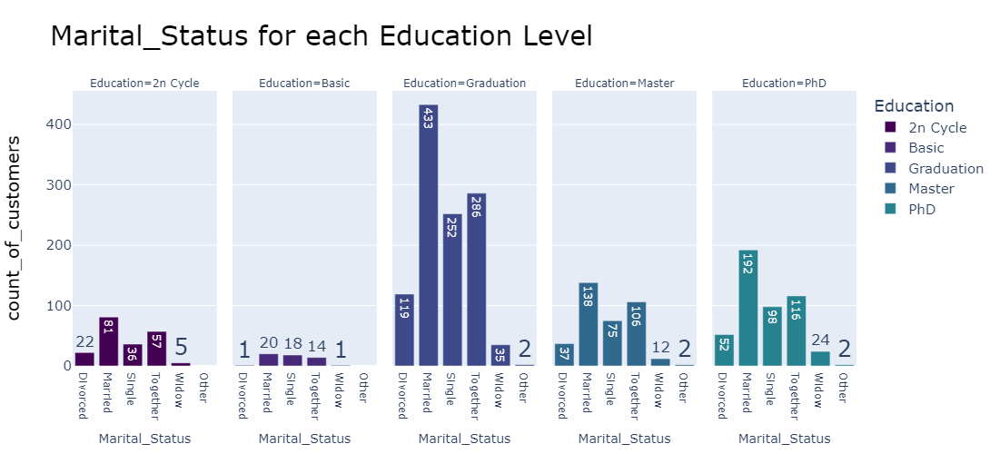

In [27]:
viridis_colors = px.colors.sequential.Viridis
fig = px.bar(data_frame=counting_customers,x='marital_status',y='count_of_customers',color='education',
             title='Marital_Status for each Education Level',
    labels={'marital_status': 'Marital_Status', 'education': 'Education'},height=500,width=900,
   color_discrete_sequence=viridis_colors,text_auto=True,facet_col='education')
fig.update_traces(textfont_size=25)
fig.update_layout(title_font=dict(size=30, color='black'),
                  yaxis_title_font=dict(size=20, color='black'),legend=dict(font=dict(size=15)),yaxis=dict(tickfont=dict(size=15)))

fig.show()

### 11.What are the total Amount spent on each Product?

In [28]:
product_columns = ['mntwines', 'mntfruits', 'mntmeatproducts', 'mntfishproducts', 'mntsweetproducts', 'mntgoldprods']
total_spent = df[product_columns].sum().reset_index().round(0)
total_spent.columns = ['product', 'revenue']
total_spent=total_spent.sort_values(by='revenue', ascending=False)
total_spent

,product,revenue
0,mntwines,679716.0
2,mntmeatproducts,373343.0
5,mntgoldprods,98316.0
3,mntfishproducts,83935.0
4,mntsweetproducts,60550.0
1,mntfruits,58764.0


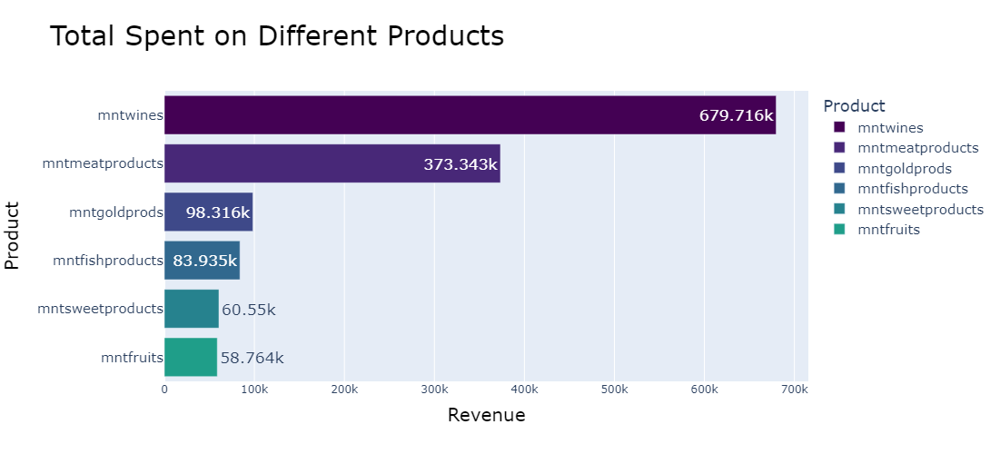

In [29]:
viridis_colors = px.colors.sequential.Viridis
fig = px.bar(data_frame=total_spent,x='revenue',y='product',color='product',title='Total Spent on Different Products',
    labels={'product': 'Product', 'revenue': 'Revenue'},height=500,width=900,
   color_discrete_sequence=viridis_colors,text_auto=True)
fig.update_traces(textfont_size=17)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=20, color='black'),
                  yaxis_title_font=dict(size=20, color='black'),legend=dict(font=dict(size=15)),yaxis=dict(tickfont=dict(size=15)))

fig.show()

### What are the Total Amount of Products that Sold by Our Customers and Their Marital status?

In [30]:
product_columns = ['mntwines', 'mntfruits', 'mntmeatproducts', 'mntfishproducts', 'mntsweetproducts', 'mntgoldprods']
grouped = df.groupby('marital_status')[product_columns].sum().reset_index()
total_spent_long = pd.melt(grouped, id_vars=['marital_status'], var_name='product', value_name='revenue')
total_spent=total_spent.sort_values(by='revenue', ascending=False)
filtered_total_spent_long = total_spent_long[total_spent_long['revenue'] > 804.0]
filtered_total_spent_long = filtered_total_spent_long.sort_values(by='revenue', ascending=False)
filtered_total_spent_long

,marital_status,product,revenue
1,Married,mntwines,258751.0
4,Together,mntwines,177204.0
13,Married,mntmeatproducts,138829.0
3,Single,mntwines,138391.0
16,Together,mntmeatproducts,96938.0
15,Single,mntmeatproducts,87407.0
0,Divorced,mntwines,75349.0
31,Married,mntgoldprods,36999.0
12,Divorced,mntmeatproducts,34840.0
19,Married,mntfishproducts,30569.0


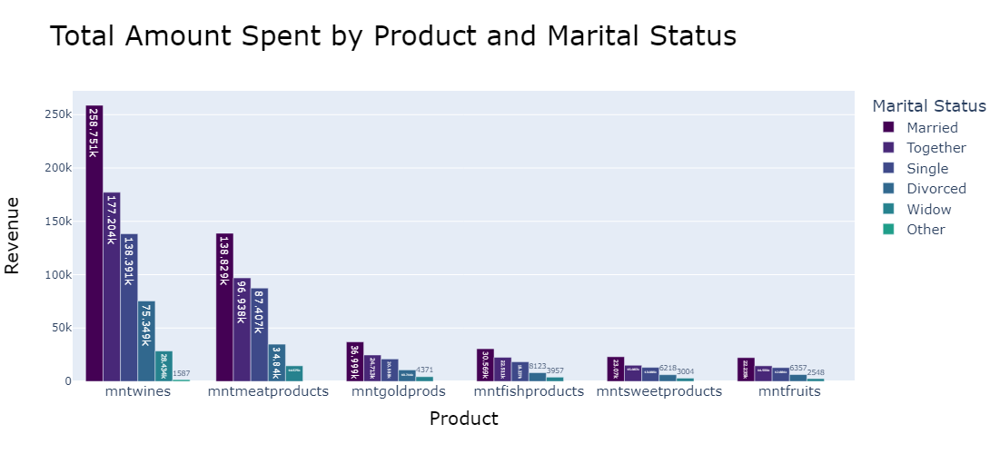

In [31]:
viridis_colors = px.colors.sequential.Viridis
fig = px.bar(data_frame=filtered_total_spent_long, x='product', y='revenue', color='marital_status',
             title='Total Amount Spent by Product and Marital Status',
             labels={'product': 'Product', 'revenue': 'Revenue', 'marital_status': 'Marital Status'},
             height=500, width=1000, color_discrete_sequence=viridis_colors, text_auto=True,barmode = 'group')
fig.update_traces(textfont_size=17)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=20, color='black'),
                yaxis_title_font=dict(size=20, color='black'),legend=dict(font=dict(size=15)), xaxis=dict(tickfont=dict(size=15)))
fig.show()

### What are the Total Amount of Products that Sold by Our Customers and Their Education?

In [32]:
product_columns = ['mntwines', 'mntfruits', 'mntmeatproducts', 'mntfishproducts', 'mntsweetproducts', 'mntgoldprods']
grouped = df.groupby('education')[product_columns].sum().reset_index()
total_spent_long = pd.melt(grouped, id_vars=['education'], var_name='product', value_name='revenue')
total_spent=total_spent.sort_values(by='revenue', ascending=False)
filtered_total_spent_long = total_spent_long[total_spent_long['revenue'] > 921.0]
filtered_total_spent_long = filtered_total_spent_long.sort_values(by='revenue', ascending=False)
filtered_total_spent_long

,education,product,revenue
2,Graduation,mntwines,320371.0
12,Graduation,mntmeatproducts,202284.0
4,PhD,mntwines,195508.0
3,Master,mntwines,123238.0
14,PhD,mntmeatproducts,81329.0
13,Master,mntmeatproducts,60450.0
27,Graduation,mntgoldprods,57307.0
17,Graduation,mntfishproducts,48630.0
0,2n Cycle,mntwines,40208.0
22,Graduation,mntsweetproducts,35351.0


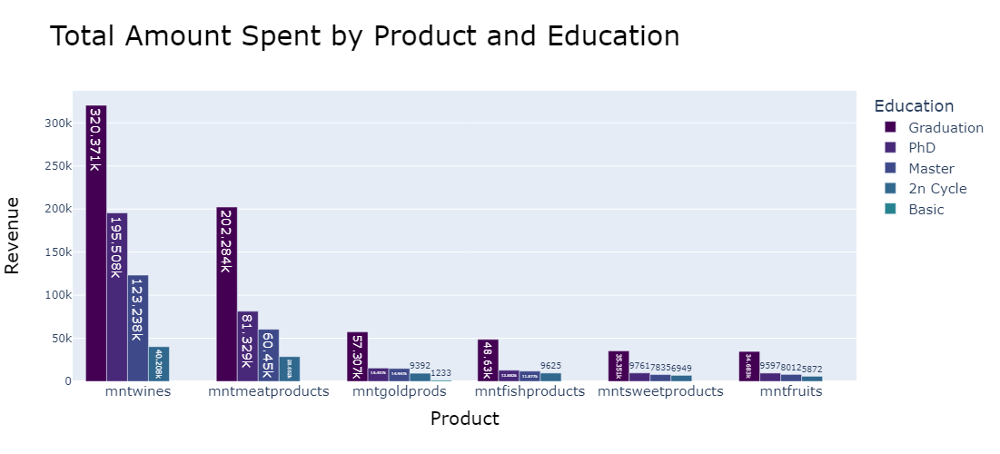

In [33]:
viridis_colors = px.colors.sequential.Viridis
fig = px.bar(data_frame=filtered_total_spent_long, x='product', y='revenue', color='education',
             title='Total Amount Spent by Product and Education',
             labels={'product': 'Product', 'revenue': 'Revenue', 'education': 'Education'},
             height=500, width=1000, color_discrete_sequence=viridis_colors, text_auto=True,barmode = 'group')
fig.update_traces(textfont_size=17)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=20, color='black'),
                yaxis_title_font=dict(size=20, color='black'),legend=dict(font=dict(size=15)), xaxis=dict(tickfont=dict(size=15)))
fig.show()

In [34]:
product_columns = ['mntwines', 'mntfruits', 'mntmeatproducts', 'mntfishproducts', 'mntsweetproducts', 'mntgoldprods']

In [35]:
grouped = df.groupby('kidhome')[product_columns].sum().reset_index()
grouped['kidhome']=grouped['kidhome'].astype(str)
grouped

,kidhome,mntwines,mntfruits,mntmeatproducts,mntfishproducts,mntsweetproducts,mntgoldprods
0,0,582282.0,50788.0,327800.0,72503.0,52298.0,77360.0
1,1,93844.0,7651.0,43919.0,11061.0,8026.0,20120.0
2,2,3590.0,325.0,1624.0,371.0,226.0,836.0


In [36]:
total_spent_long = pd.melt(grouped, id_vars=['kidhome'], var_name='product', value_name='revenue')
total_spent=total_spent_long.sort_values(by='revenue', ascending=False)
total_spent

,kidhome,product,revenue
0,0,mntwines,582282.0
6,0,mntmeatproducts,327800.0
1,1,mntwines,93844.0
15,0,mntgoldprods,77360.0
9,0,mntfishproducts,72503.0
12,0,mntsweetproducts,52298.0
3,0,mntfruits,50788.0
7,1,mntmeatproducts,43919.0
16,1,mntgoldprods,20120.0
10,1,mntfishproducts,11061.0


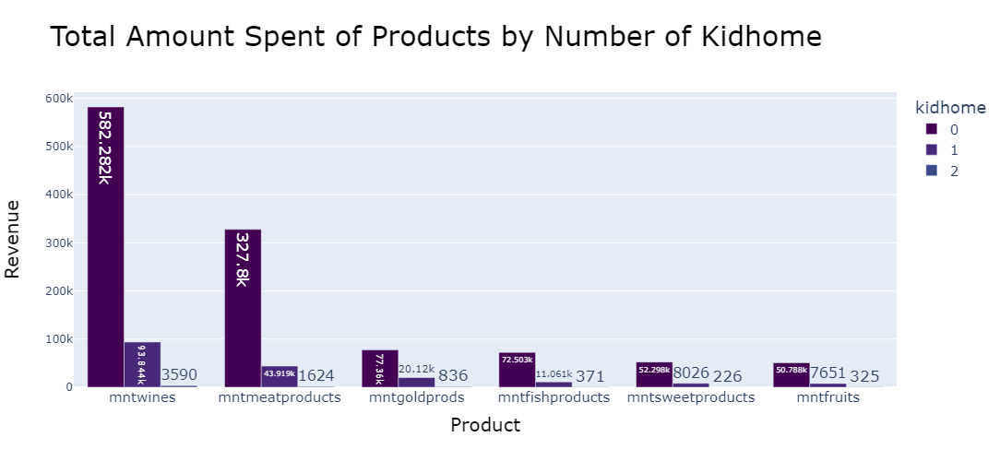

In [37]:
viridis_colors = px.colors.sequential.Viridis
fig = px.bar(data_frame=total_spent, x='product', y='revenue', color='kidhome',
             title='Total Amount Spent of Products by Number of Kidhome',
             labels={'product': 'Product', 'revenue': 'Revenue', 'kidhome': 'kidhome'},
             height=500, width=1000, color_discrete_sequence=viridis_colors, text_auto=True,barmode = 'group')
fig.update_traces(textfont_size=17)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=20, color='black'),
                yaxis_title_font=dict(size=20, color='black'),legend=dict(font=dict(size=15)), xaxis=dict(tickfont=dict(size=15)))
fig.show()

In [38]:
grouped = df.groupby('teenhome')[product_columns].sum().reset_index()
grouped['teenhome']=grouped['teenhome'].astype(str)
grouped

,teenhome,mntwines,mntfruits,mntmeatproducts,mntfishproducts,mntsweetproducts,mntgoldprods
0,0,352215.0,38423.0,262435.0,56235.0,38877.0,52158.0
1,1,308680.0,19430.0,104420.0,26457.0,20837.0,43821.0
2,2,18821.0,911.0,6488.0,1243.0,836.0,2337.0


In [39]:
total_spent_long = pd.melt(grouped, id_vars=['teenhome'], var_name='product', value_name='revenue')
total_spent=total_spent_long.sort_values(by='revenue', ascending=False)
total_spent

,teenhome,product,revenue
0,0,mntwines,352215.0
1,1,mntwines,308680.0
6,0,mntmeatproducts,262435.0
7,1,mntmeatproducts,104420.0
9,0,mntfishproducts,56235.0
15,0,mntgoldprods,52158.0
16,1,mntgoldprods,43821.0
12,0,mntsweetproducts,38877.0
3,0,mntfruits,38423.0
10,1,mntfishproducts,26457.0


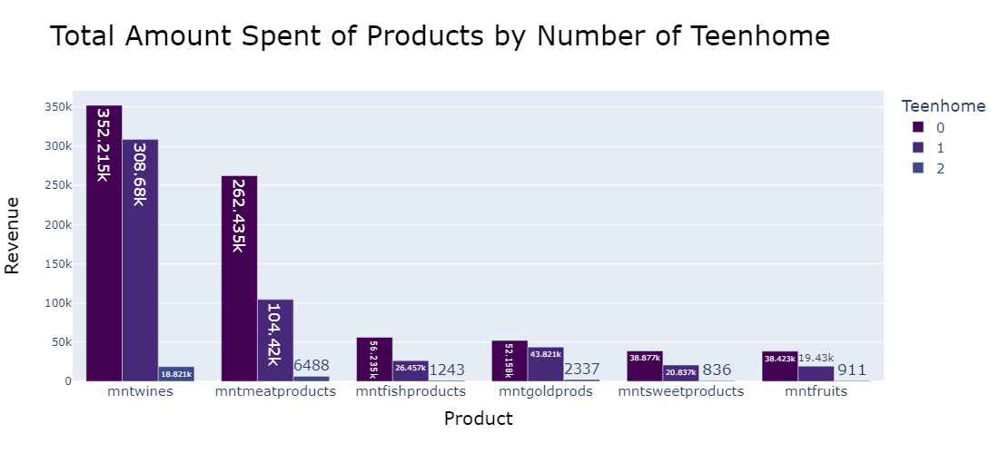

In [40]:
viridis_colors = px.colors.sequential.Viridis
fig = px.bar(data_frame=total_spent, x='product', y='revenue', color='teenhome',
             title='Total Amount Spent of Products by Number of Teenhome',
             labels={'product': 'Product', 'revenue': 'Revenue', 'teenhome': 'Teenhome'},
             height=500, width=1000, color_discrete_sequence=viridis_colors, text_auto=True,barmode = 'group')
fig.update_traces(textfont_size=17)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=20, color='black'),
                yaxis_title_font=dict(size=20, color='black'),legend=dict(font=dict(size=15)), xaxis=dict(tickfont=dict(size=15)))
fig.show()

### What are the Average Ages of Our Customers and Their Education and Marital Status?

In [41]:
sorted_df = df.groupby(['marital_status','education'])['age'].mean().reset_index().round(0).sort_values(by='age',ascending = True)
sorted_df

,marital_status,education,age
10,Other,Graduation,34.0
14,Single,Basic,41.0
6,Married,Basic,46.0
13,Single,2n Cycle,48.0
1,Divorced,Basic,48.0
18,Together,2n Cycle,50.0
5,Married,2n Cycle,51.0
12,Other,PhD,51.0
15,Single,Graduation,52.0
19,Together,Basic,53.0


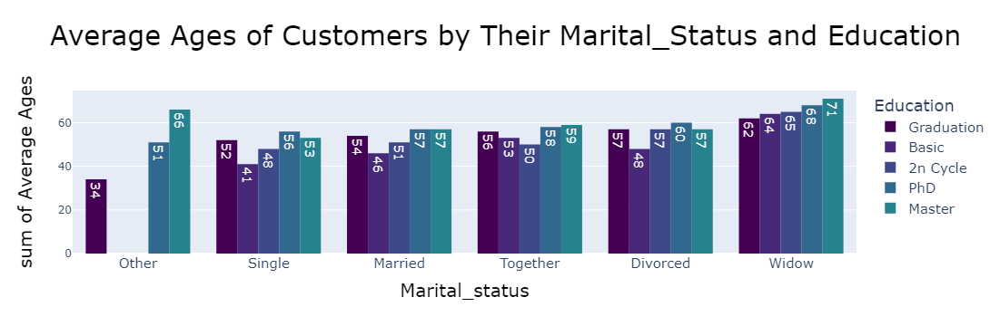

In [42]:
viridis_colors = px.colors.sequential.Viridis
fig=px.histogram(data_frame=sorted_df , x = 'marital_status' , y = 'age' , color='education',
             title='Average Ages of Customers by Their Marital_Status and Education',
             labels={'marital_status': 'Marital_status', 'age': 'Average Ages', 'education': 'Education'},
             text_auto=True  , barmode='group' , color_discrete_sequence=viridis_colors)
fig.update_traces(textfont_size=17)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=20, color='black'),
                yaxis_title_font=dict(size=20, color='black'),legend=dict(font=dict(size=15)), xaxis=dict(tickfont=dict(size=15)))
fig.show()

### 20.What are the Total Number Of Purchasing for Each Sales Channel?

In [197]:
sales_channels = ['numstorepurchases','numwebpurchases', 'numcatalogpurchases','numdealspurchases']
grouped = df.groupby('id')[sales_channels].sum().reset_index()
grouped

,id,numstorepurchases,numwebpurchases,numcatalogpurchases,numdealspurchases
0,0,9,3,4,1
1,1,7,7,3,1
2,9,2,3,2,4
3,13,3,1,0,2
4,17,7,6,11,4
...,...,...,...,...,...
2231,11178,3,1,0,1
2232,11181,0,0,0,0
2233,11187,3,2,1,3
2234,11188,3,2,1,3


In [198]:
total_Num_perch = pd.melt(grouped, id_vars=['id'], var_name='sales_channels', value_name='total purchases')
df_sorted=total_Num_perch.sort_values(by='total purchases',ascending=False)
df_sorted

,id,sales_channels,total purchases
5575,5376,numcatalogpurchases,28
5460,4931,numcatalogpurchases,28
4770,1501,numcatalogpurchases,28
3307,5255,numwebpurchases,27
3167,4619,numwebpurchases,27
...,...,...,...
6183,8619,numcatalogpurchases,0
4997,2661,numcatalogpurchases,0
6185,8625,numcatalogpurchases,0
6186,8629,numcatalogpurchases,0


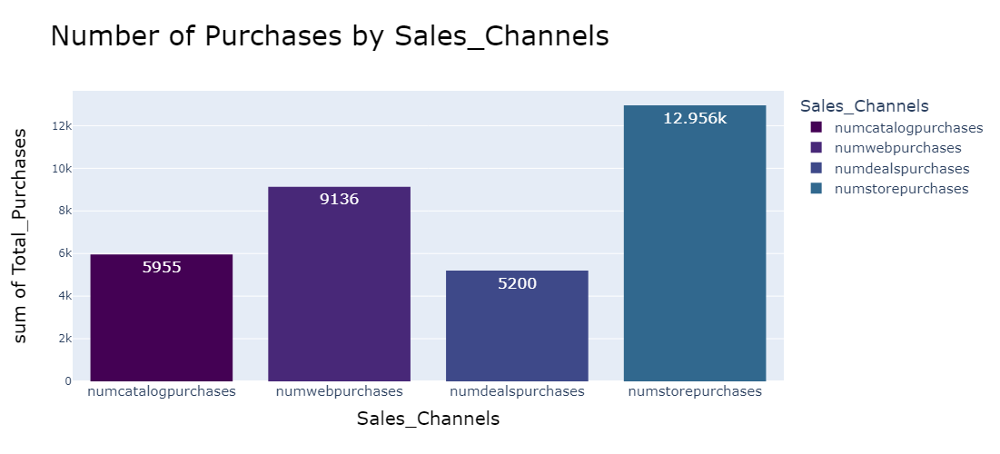

In [199]:
viridis_colors = px.colors.sequential.Viridis
fig = px.histogram(data_frame=df_sorted, x='sales_channels', y='total purchases', color='sales_channels',
             title='Number of Purchases by Sales_Channels',
             labels={'sales_channels': 'Sales_Channels', 'total purchases': 'Total_Purchases'},
             height=500, width=1000, color_discrete_sequence=viridis_colors, text_auto=True)
fig.update_traces(textfont_size=17)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=20, color='black'),
                yaxis_title_font=dict(size=20, color='black'),legend=dict(font=dict(size=15)), xaxis=dict(tickfont=dict(size=15)))
fig.show()

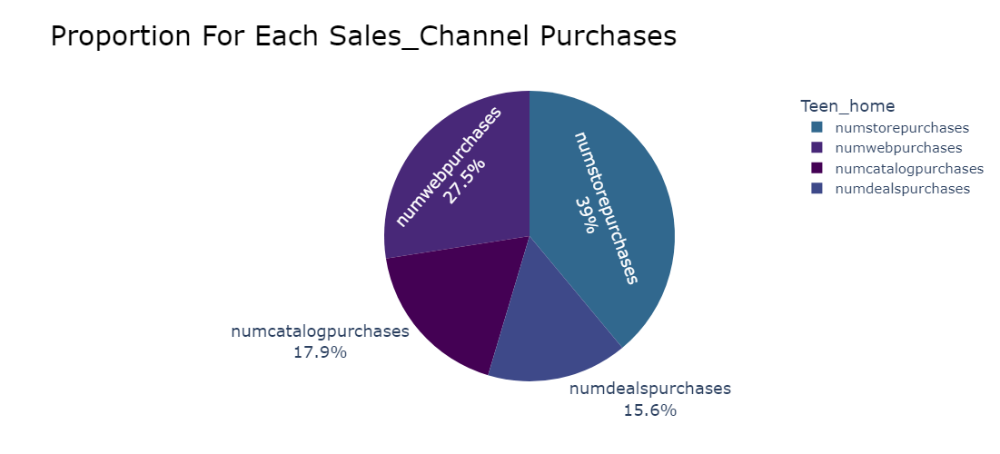

In [201]:
viridis_colors = px.colors.sequential.Viridis
fig =px.pie(data_frame=df_sorted , names='sales_channels' ,values='total purchases',
       color_discrete_sequence=viridis_colors,title='Proportion For Each Sales_Channel Purchases',
       color='sales_channels',height=500,width=900)
fig.update_traces(textinfo='label+percent', textfont=dict(size=18))
fig.update_layout(title_font=dict(size=30, color='black'),legend_title='Teen_home')
fig.update_layout(legend=dict(font=dict(size=15)))
fig.show()

### 21.What are the Number of Purchasing for each Sales_Channels and The Customers Marital_Status?

In [46]:
sales_channels = ['numstorepurchases','numwebpurchases', 'numcatalogpurchases','numdealspurchases']
grouped = df.groupby('marital_status')[sales_channels].sum().reset_index()
grouped

,marital_status,numstorepurchases,numwebpurchases,numcatalogpurchases,numdealspurchases
0,Divorced,1348,998,619,564
1,Married,5055,3532,2268,2067
2,Other,31,29,18,20
3,Single,2705,1858,1248,1022
4,Together,3323,2363,1546,1347
5,Widow,494,356,256,180


In [47]:
total_Num_by_Marital_status = pd.melt(grouped, id_vars=['marital_status'], var_name='sales_channels', value_name='total purchases')
df_sorted=total_Num_by_Marital_status.sort_values(by='total purchases',ascending=False)
df_sorted

,marital_status,sales_channels,total purchases
1,Married,numstorepurchases,5055
7,Married,numwebpurchases,3532
4,Together,numstorepurchases,3323
3,Single,numstorepurchases,2705
10,Together,numwebpurchases,2363
13,Married,numcatalogpurchases,2268
19,Married,numdealspurchases,2067
9,Single,numwebpurchases,1858
16,Together,numcatalogpurchases,1546
0,Divorced,numstorepurchases,1348


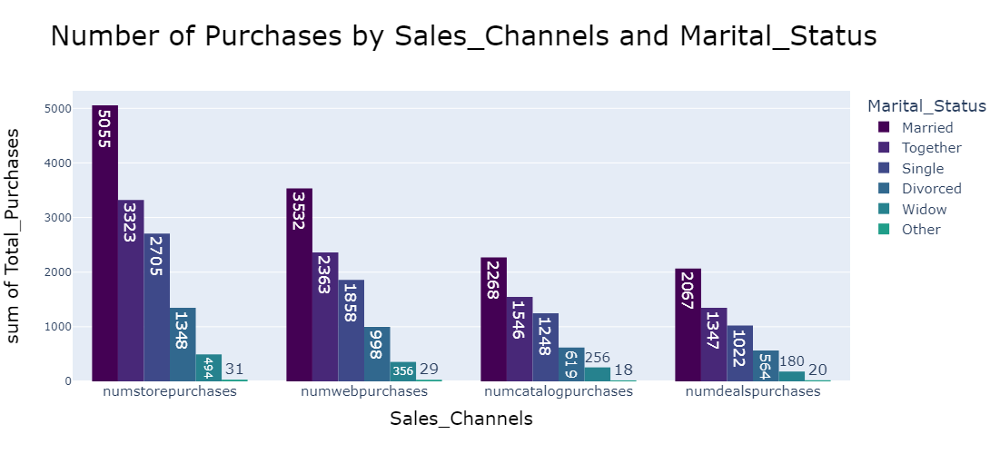

In [48]:
viridis_colors = px.colors.sequential.Viridis
fig = px.histogram(data_frame=df_sorted, x='sales_channels', y='total purchases', color='marital_status',
             title='Number of Purchases by Sales_Channels and Marital_Status',
             labels={'sales_channels': 'Sales_Channels', 'total purchases': 'Total_Purchases','marital_status':'Marital_Status'},
             height=500, width=1000, color_discrete_sequence=viridis_colors, text_auto=True,barmode= 'group')
fig.update_traces(textfont_size=17)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=20, color='black'),
                yaxis_title_font=dict(size=20, color='black'),legend=dict(font=dict(size=15)), xaxis=dict(tickfont=dict(size=15)))
fig.show()

### What are the total numbers purchases That made by sales_channels and Education of those Customers?

In [190]:
sales_channels = ['numstorepurchases','numwebpurchases', 'numcatalogpurchases','numdealspurchases']
grouped = df.groupby('education')[sales_channels].sum().reset_index()
grouped

,education,numstorepurchases,numwebpurchases,numcatalogpurchases,numdealspurchases
0,2n Cycle,1114,754,470,454
1,Basic,154,102,26,97
2,Graduation,6570,4649,3072,2603
3,Master,2182,1492,951,898
4,PhD,2936,2139,1436,1148


In [191]:
total_Num_by_education = pd.melt(grouped, id_vars=['education'], var_name='sales_channels', value_name='total purchases')
df_sorted=total_Num_by_education.sort_values(by='total purchases',ascending=False)
df_sorted

,education,sales_channels,total purchases
2,Graduation,numstorepurchases,6570
7,Graduation,numwebpurchases,4649
12,Graduation,numcatalogpurchases,3072
4,PhD,numstorepurchases,2936
17,Graduation,numdealspurchases,2603
3,Master,numstorepurchases,2182
9,PhD,numwebpurchases,2139
8,Master,numwebpurchases,1492
14,PhD,numcatalogpurchases,1436
19,PhD,numdealspurchases,1148


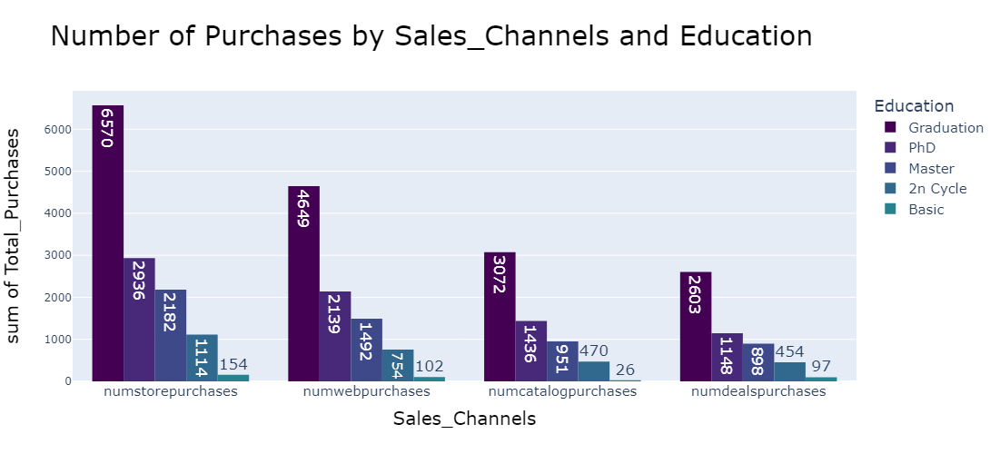

In [192]:
viridis_colors = px.colors.sequential.Viridis
fig = px.histogram(data_frame=df_sorted, x='sales_channels', y='total purchases', color='education',
             title='Number of Purchases by Sales_Channels and Education',
             labels={'sales_channels': 'Sales_Channels', 'total purchases': 'Total_Purchases','education':'Education'},
             height=500, width=1000, color_discrete_sequence=viridis_colors, text_auto=True,barmode= 'group')
fig.update_traces(textfont_size=17)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=20, color='black'),
                yaxis_title_font=dict(size=20, color='black'),legend=dict(font=dict(size=15)), xaxis=dict(tickfont=dict(size=15)))
fig.show()

### 22.What are the Number of Purchasing for each Sales_Channels and The Customers Ages?

In [267]:
sales_channels = ['numstorepurchases','numwebpurchases', 'numcatalogpurchases','numdealspurchases']
grouped = df.groupby('grouped_age')[sales_channels].sum().reset_index()
grouped

,grouped_age,numstorepurchases,numwebpurchases,numcatalogpurchases,numdealspurchases
0,20-30,69,33,39,12
1,31-40,1315,824,587,429
2,41-50,3175,2238,1336,1327
3,51-60,3641,2695,1591,1666
4,61-70,3009,2117,1492,1205
5,71-80,1676,1176,858,550
6,81-90,71,53,52,11


In [195]:
total_Num_by_Marital_status = pd.melt(grouped, id_vars=['grouped_age'], var_name='sales_channels', value_name='total purchases')
df_sorted=total_Num_by_Marital_status.sort_values(by='total purchases',ascending=False)
df_sorted

,grouped_age,sales_channels,total purchases
3,51-60,numstorepurchases,3641
2,41-50,numstorepurchases,3175
4,61-70,numstorepurchases,3009
10,51-60,numwebpurchases,2695
9,41-50,numwebpurchases,2238
11,61-70,numwebpurchases,2117
5,71-80,numstorepurchases,1676
24,51-60,numdealspurchases,1666
17,51-60,numcatalogpurchases,1591
18,61-70,numcatalogpurchases,1492


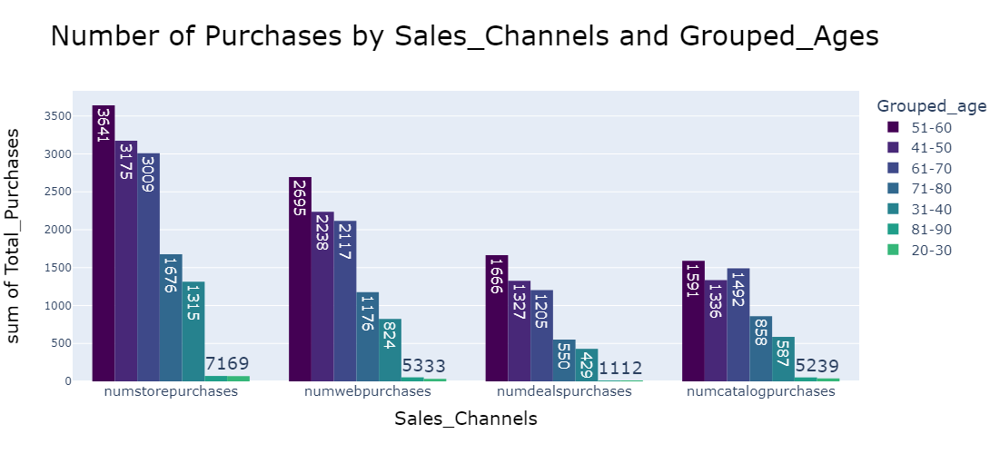

In [196]:
viridis_colors = px.colors.sequential.Viridis
fig = px.histogram(data_frame=df_sorted, x='sales_channels', y='total purchases', color='grouped_age',
             title='Number of Purchases by Sales_Channels and Grouped_Ages',
             labels={'sales_channels': 'Sales_Channels', 'total purchases': 'Total_Purchases','grouped_age':'Grouped_age'},
             height=500, width=1000, color_discrete_sequence=viridis_colors, text_auto=True,barmode= 'group')
fig.update_traces(textfont_size=20)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=20, color='black'),
                yaxis_title_font=dict(size=20, color='black'),legend=dict(font=dict(size=15)), xaxis=dict(tickfont=dict(size=15)))
fig.show()

In [269]:
grouped = df.groupby('kidhome')[sales_channels].sum().reset_index()
grouped

,kidhome,numstorepurchases,numwebpurchases,numcatalogpurchases,numdealspurchases
0,0,9320,6419,5111,2507
1,1,3471,2583,810,2557
2,2,165,134,34,136


In [270]:
total_Num_by_kidhome = pd.melt(grouped, id_vars=['kidhome'], var_name='sales_channels', value_name='total purchases')
df_sorted=total_Num_by_kidhome.sort_values(by='total purchases',ascending=False)
df_sorted

,kidhome,sales_channels,total purchases
0,0,numstorepurchases,9320
3,0,numwebpurchases,6419
6,0,numcatalogpurchases,5111
1,1,numstorepurchases,3471
4,1,numwebpurchases,2583
10,1,numdealspurchases,2557
9,0,numdealspurchases,2507
7,1,numcatalogpurchases,810
2,2,numstorepurchases,165
11,2,numdealspurchases,136


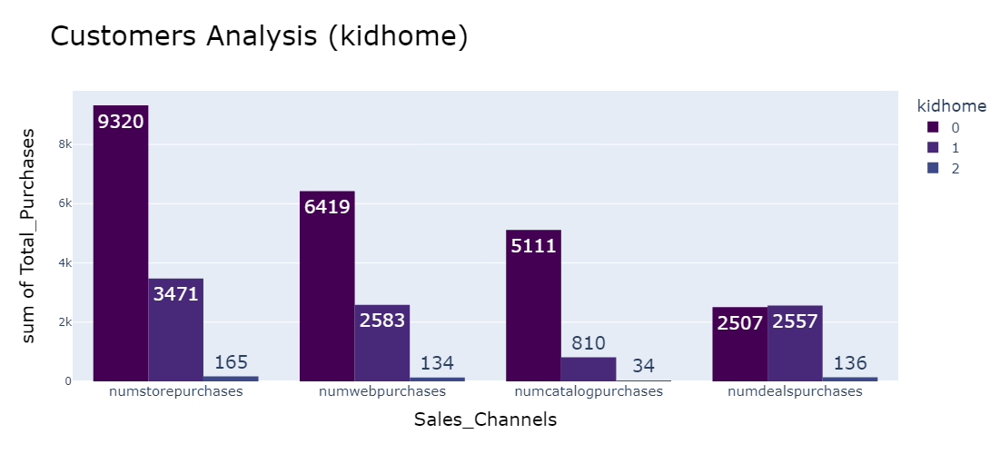

In [271]:
viridis_colors = px.colors.sequential.Viridis
fig = px.histogram(data_frame=df_sorted, x='sales_channels', y='total purchases', color='kidhome',
             title='Customers Analysis (kidhome)',
             labels={'sales_channels': 'Sales_Channels', 'total purchases': 'Total_Purchases','kidhome':'kidhome'},
             height=500, width=1000, color_discrete_sequence=viridis_colors, text_auto=True,barmode= 'group')
fig.update_traces(textfont_size=20)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=20, color='black'),
                yaxis_title_font=dict(size=20, color='black'),legend=dict(font=dict(size=15)), xaxis=dict(tickfont=dict(size=15)))
fig.show()

### What are the counts of Campaigns Acceptance?

In [232]:
campaigns = ['acceptedcmp3','acceptedcmp4', 'acceptedcmp5','acceptedcmp1','acceptedcmp2']
grouped = df.groupby('id')[campaigns].sum().reset_index()
grouped

,id,acceptedcmp3,acceptedcmp4,acceptedcmp5,acceptedcmp1,acceptedcmp2
0,0,0,0,0,0,0
1,1,0,0,0,0,1
2,9,0,0,0,0,0
3,13,0,0,0,0,0
4,17,0,0,0,0,0
...,...,...,...,...,...,...
2231,11178,0,0,0,0,0
2232,11181,0,0,0,0,0
2233,11187,0,0,0,0,0
2234,11188,0,0,0,0,0


In [213]:
melted_df = pd.melt(grouped, id_vars=['id'], value_vars=campaigns, var_name='campaign', value_name='accepted')
counts = melted_df.groupby(['campaign', 'accepted']).size().unstack(fill_value=0).reset_index()
counts.columns = ['campaign','not accepted (0)', 'accepted (1)']

In [214]:
melted_counts = pd.melt(counts, id_vars=['campaign'], value_vars=['not accepted (0)', 'accepted (1)'], 
                        var_name='acceptance_status', value_name='count')

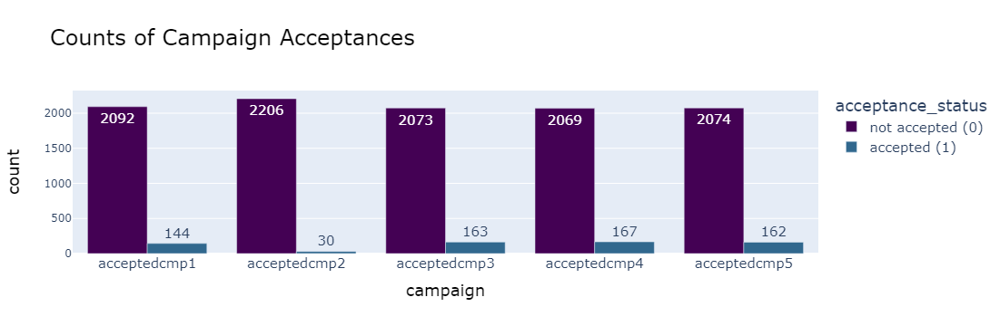

In [215]:
viridis_colors = px.colors.sequential.Viridis
selected_colors = [viridis_colors[0], viridis_colors[3]]
color_discrete_map = {
    'not accepted (0)': selected_colors[0],
    'accepted (1)': selected_colors[1],
}
fig = px.bar(melted_counts, x='campaign', y='count', color='acceptance_status', 
             title='Counts of Campaign Acceptances', 
             color_discrete_map=color_discrete_map,barmode='group',text_auto=True)
fig.update_layout(title_font=dict(size=24, color='black'),xaxis_title_font=dict(size=18, color='black'),yaxis_title_font=dict(size=18, color='black'),
                  legend=dict(font=dict(size=15)),xaxis=dict(tickfont=dict(size=15)))
fig.update_traces(textfont=dict(size=15))
fig.show()

### What are the different Numbers between our Customers that only Visit our Website and Customers who Visit and made Purchasing?

In [202]:
columns_of_web = ['numwebvisitsmonth','numwebpurchases']
counting_columns = df[columns_of_web].sum().reset_index()
counting_columns.columns = ['columns', 'count']

In [203]:
counting_columns

,columns,count
0,numwebvisitsmonth,11891
1,numwebpurchases,9136


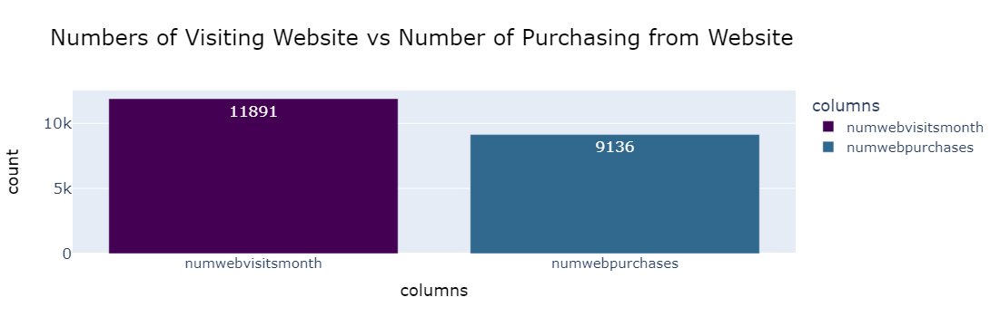

In [204]:
viridis_colors = px.colors.sequential.Viridis
selected_colors = [viridis_colors[0], viridis_colors[3]]
color_discrete_map = {
    'numwebvisitsmonth': selected_colors[0],
    'numwebpurchases': selected_colors[1],
}    
fig = px.bar(counting_columns, x='columns', y='count', title='Numbers of Visiting Website vs Number of Purchasing from Website', 
             color='columns', color_discrete_map=color_discrete_map,text='count')
fig.update_layout(title_font=dict(size=24, color='black'),xaxis_title_font=dict(size=18, color='black'),yaxis_title_font=dict(size=18, color='black'),
                  legend=dict(font=dict(size=15)),xaxis=dict(tickfont=dict(size=15)),yaxis=dict(tickfont=dict(size=17)))
fig.update_traces( textposition='inside',textfont=dict(size=17))
fig.show()

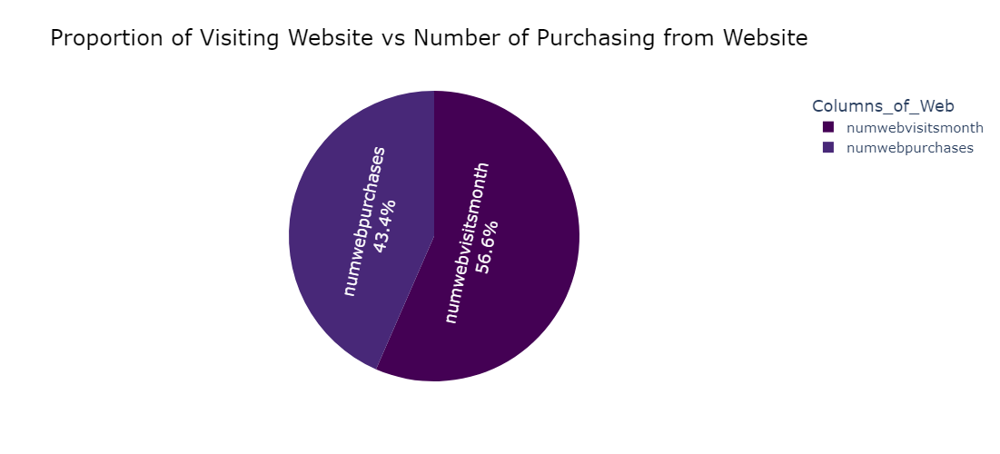

In [208]:
viridis_colors = px.colors.sequential.Viridis
fig =px.pie(data_frame=counting_columns , names='columns' ,values='count',
       color_discrete_sequence=viridis_colors,title='Proportion of Visiting Website vs Number of Purchasing from Website',
       color='count',height=500,width=900)
fig.update_traces(textinfo='label+percent', textfont=dict(size=18))
fig.update_layout(title_font=dict(size=24, color='black'),legend_title='Columns_of_Web')
fig.update_layout(legend=dict(font=dict(size=15)))
fig.show()

### What are the Counts of Customers that visit our website only VS customers that visit and Purchases by Grouped_Ages?

In [63]:
columns_of_web = ['numwebvisitsmonth','numwebpurchases']
counting_columns = df.groupby('grouped_age')[columns_of_web].sum().reset_index()


In [64]:
counting_columns

,grouped_age,numwebvisitsmonth,numwebpurchases
0,20-30,45,33
1,31-40,1359,824
2,41-50,3282,2238
3,51-60,3625,2695
4,61-70,2346,2117
5,71-80,1202,1176
6,81-90,32,53


In [65]:
counting_columns.columns = ['grouped_age'] + columns_of_web
melted_columns = pd.melt(counting_columns, id_vars=['grouped_age'],var_name='columns', value_name='count')
sorted_df=melted_columns.sort_values(by="count",ascending= False)
sorted_df

,grouped_age,columns,count
3,51-60,numwebvisitsmonth,3625
2,41-50,numwebvisitsmonth,3282
10,51-60,numwebpurchases,2695
4,61-70,numwebvisitsmonth,2346
9,41-50,numwebpurchases,2238
11,61-70,numwebpurchases,2117
1,31-40,numwebvisitsmonth,1359
5,71-80,numwebvisitsmonth,1202
12,71-80,numwebpurchases,1176
8,31-40,numwebpurchases,824


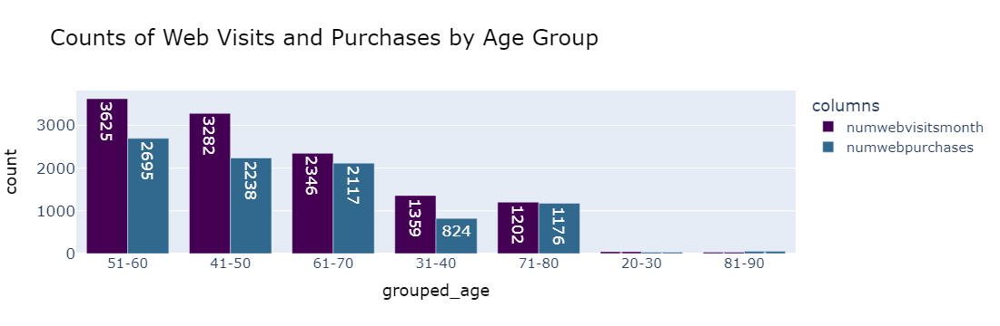

In [66]:
viridis_colors = px.colors.sequential.Viridis
selected_colors = [viridis_colors[0], viridis_colors[3]]
color_discrete_map = {
    'numwebvisitsmonth': selected_colors[0],
    'numwebpurchases': selected_colors[1],
}
fig = px.bar(sorted_df, x='grouped_age', y='count', color='columns',title='Counts of Web Visits and Purchases by Age Group', 
             color_discrete_map=color_discrete_map, text='count', barmode='group')
fig.update_layout(title_font=dict(size=24, color='black'),xaxis_title_font=dict(size=18, color='black'),yaxis_title_font=dict(size=18, color='black'),
                  legend=dict(font=dict(size=15)),xaxis=dict(tickfont=dict(size=15)),yaxis=dict(tickfont=dict(size=17)))
fig.update_traces( textposition='inside',textfont=dict(size=17))
fig.show()

### 27.What are the Marital_Status of our Customers that visit our website only Vs whose made Purchases?

In [67]:
columns_of_web = ['numwebvisitsmonth','numwebpurchases']
counting_columns = df.groupby('marital_status')[columns_of_web].sum().reset_index()


In [68]:
counting_columns

,marital_status,numwebvisitsmonth,numwebpurchases
0,Divorced,1268,998
1,Married,4635,3532
2,Other,30,29
3,Single,2532,1858
4,Together,3050,2363
5,Widow,376,356


In [69]:
counting_columns.columns = ['marital_status'] + columns_of_web
melted_columns = pd.melt(counting_columns, id_vars=['marital_status'],var_name='columns', value_name='count')

In [70]:
df_sorted=melted_columns.sort_values(by="count",ascending = False)
df_sorted

,marital_status,columns,count
1,Married,numwebvisitsmonth,4635
7,Married,numwebpurchases,3532
4,Together,numwebvisitsmonth,3050
3,Single,numwebvisitsmonth,2532
10,Together,numwebpurchases,2363
9,Single,numwebpurchases,1858
0,Divorced,numwebvisitsmonth,1268
6,Divorced,numwebpurchases,998
5,Widow,numwebvisitsmonth,376
11,Widow,numwebpurchases,356


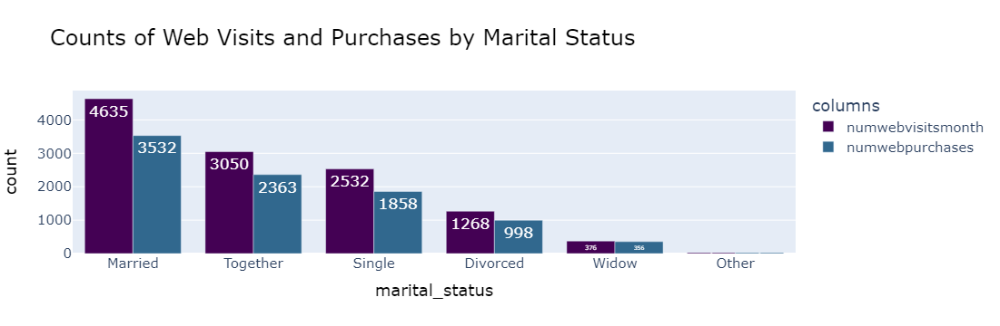

In [71]:
viridis_colors = px.colors.sequential.Viridis
selected_colors = [viridis_colors[0], viridis_colors[3]]
color_discrete_map = {
    'numwebvisitsmonth': selected_colors[0],
    'numwebpurchases': selected_colors[1],
}
fig = px.bar(df_sorted, x='marital_status', y='count', color='columns',title='Counts of Web Visits and Purchases by Marital Status', 
             color_discrete_map=color_discrete_map, text='count', barmode='group',text_auto=True)
fig.update_layout(title_font=dict(size=24, color='black'),xaxis_title_font=dict(size=18, color='black'),yaxis_title_font=dict(size=18, color='black'),
                  legend=dict(font=dict(size=15)),xaxis=dict(tickfont=dict(size=15)),yaxis=dict(tickfont=dict(size=15)))
fig.update_traces(textposition='inside', textfont=dict(size=17))
fig.show()

### What are the Average yearly income for each year and Quarter?

In [72]:
avg_income_year = df.groupby(['year','quarter'])['income$'].mean().reset_index().round(0)

In [73]:
sorted_df=avg_income_year.sort_values(by='quarter',ascending = True)
sorted_df

,year,quarter,income$
2,2013,1,50462.0
6,2014,1,52504.0
3,2013,2,57065.0
7,2014,2,53120.0
0,2012,3,53012.0
4,2013,3,49801.0
1,2012,4,49687.0
5,2013,4,52669.0


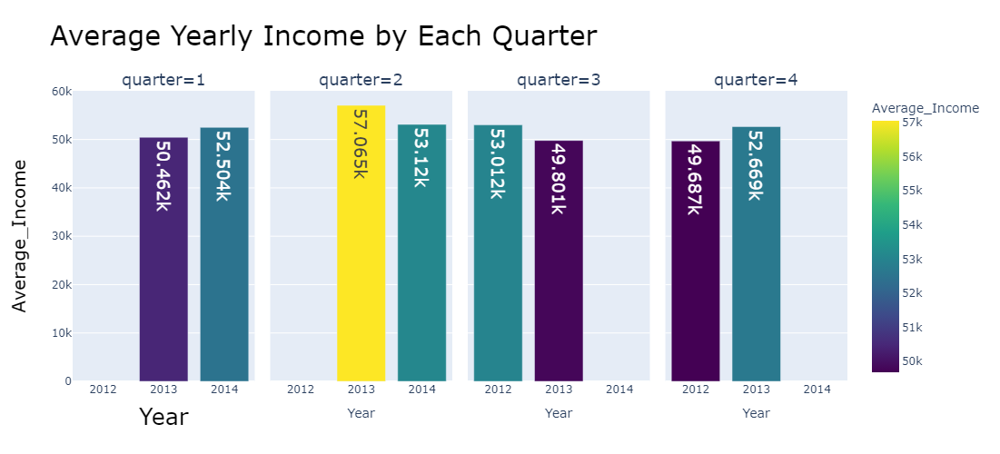

In [74]:
fig = px.bar(data_frame=sorted_df,x='year',y='income$',title='Average Yearly Income by Each Quarter',
             labels={'year': 'Year', 'income$': 'Average_Income'},height=500,width=900,color='income$',
             color_continuous_scale=px.colors.sequential.Viridis,text_auto=True,facet_col='quarter')
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))
for annotation in fig.layout.annotations:
    annotation.font.size = 18
fig.show()

### What are the Average income for our Customers by each year?

In [75]:
avg_income_year = df.groupby(['year','marital_status'])['income$'].mean().reset_index().round(0)
avg_income_year

,year,marital_status,income$
0,2012,Divorced,51874.0
1,2012,Married,52404.0
2,2012,Other,63838.0
3,2012,Single,51104.0
4,2012,Together,49203.0
5,2012,Widow,49077.0
6,2013,Divorced,54287.0
7,2013,Married,50968.0
8,2013,Other,61331.0
9,2013,Single,49788.0


In [76]:
sorted_df=avg_income_year.sort_values(by='income$',ascending = False)
sorted_df

,year,marital_status,income$
2,2012,Other,63838.0
17,2014,Widow,63676.0
8,2013,Other,61331.0
11,2013,Widow,57004.0
10,2013,Together,55249.0
6,2013,Divorced,54287.0
15,2014,Single,53337.0
13,2014,Married,52674.0
1,2012,Married,52404.0
16,2014,Together,52179.0


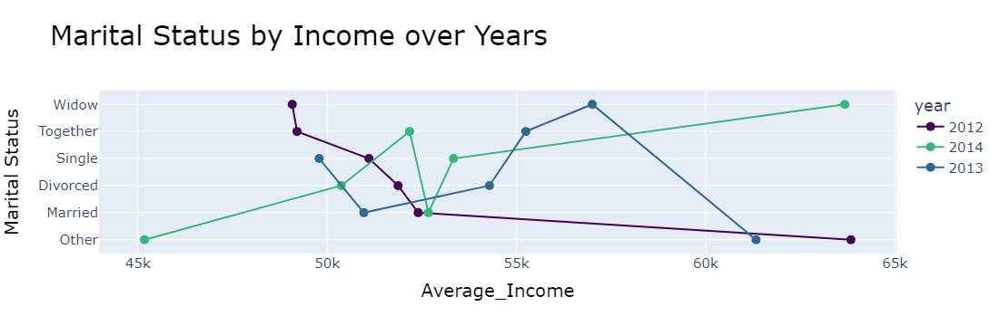

In [77]:
viridis_colors = px.colors.sequential.Viridis
selected_colors = [viridis_colors[0], viridis_colors[3], viridis_colors[6]]
color_discrete_map = {
    2012: selected_colors[0],
    2013: selected_colors[1],
    2014: selected_colors[2]
}
fig=px.line(data_frame=sorted_df , x = 'income$' , y ='marital_status' ,color='year'  , markers=True,
                         title='Marital Status by Income over Years', color_discrete_map=color_discrete_map)
fig.update_traces(marker=dict(size=10, symbol='circle'), textposition='top center', textfont=dict(size=12))
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title='Average_Income',xaxis_title_font=dict(size=20, color='black'),
                  yaxis_title='Marital Status',yaxis_title_font=dict(size=20, color='black'),legend=dict(font=dict(size=15)),
                  xaxis=dict(tickfont=dict(size=15)),yaxis=dict(tickfont=dict(size=15)))

fig.show()       

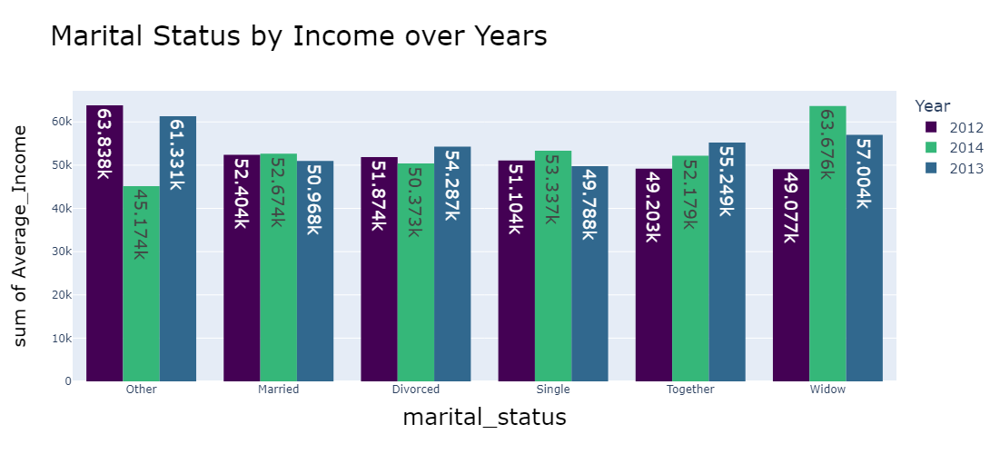

In [78]:
viridis_colors = px.colors.sequential.Viridis
selected_colors = [viridis_colors[0], viridis_colors[3], viridis_colors[6]]
color_discrete_map = {
    2012: selected_colors[0],
    2013: selected_colors[1],
    2014: selected_colors[2]
}
fig = px.histogram(data_frame=sorted_df,x='marital_status',y='income$',title='Marital Status by Income over Years',
             labels={'year': 'Year', 'income$': 'Average_Income'},height=500,width=900,color='year',
                 color_discrete_map=color_discrete_map,text_auto=True,barmode='group')
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))

In [79]:
avg_income_year_edu = df.groupby(['year','education'])['income$'].mean().reset_index().round(0).sort_values(by='income$',ascending = False)
avg_income_year_edu

,year,education,income$
9,2013,PhD,57584.0
3,2012,Master,57071.0
4,2012,PhD,56798.0
12,2014,Graduation,54164.0
7,2013,Graduation,52975.0
14,2014,PhD,52945.0
13,2014,Master,52914.0
8,2013,Master,51665.0
2,2012,Graduation,50524.0
10,2014,2n Cycle,50123.0


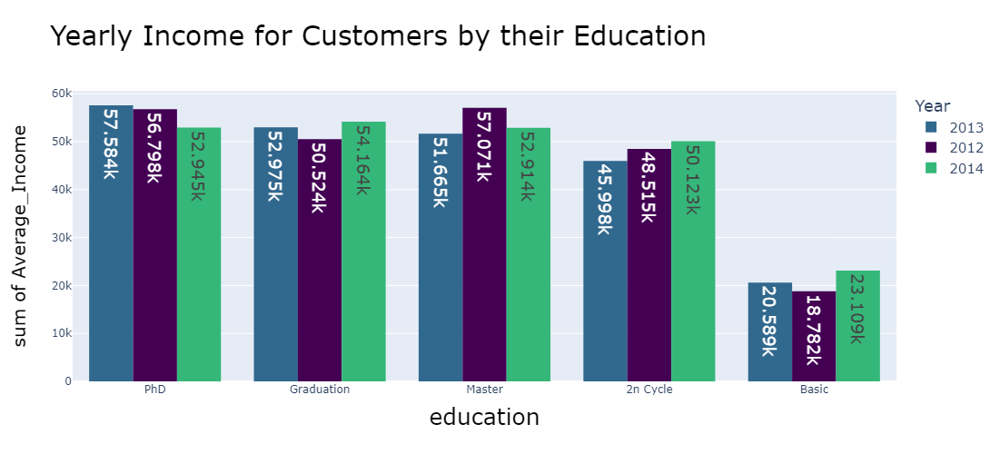

In [80]:
viridis_colors = px.colors.sequential.Viridis
selected_colors = [viridis_colors[0], viridis_colors[3], viridis_colors[6]]
color_discrete_map = {
    2012: selected_colors[0],
    2013: selected_colors[1],
    2014: selected_colors[2]
}
fig = px.histogram(data_frame=avg_income_year_edu,x='education',y='income$',title='Yearly Income for Customers by their Education',
             labels={'year': 'Year', 'income$': 'Average_Income'},height=500,width=900,color='year',
                 color_discrete_map=color_discrete_map,text_auto=True,barmode='group')
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))

### 30.What are The Average Income for our Customers by Each Year On Each Month?

In [81]:
avg_income_year_month = df.groupby(['year','month_name'])['income$'].mean().reset_index().round(0)
avg_income_year_month

,year,month_name,income$
0,2012,August,50835.0
1,2012,December,45978.0
2,2012,July,53680.0
3,2012,November,51437.0
4,2012,October,51176.0
5,2012,September,55624.0
6,2013,April,54195.0
7,2013,August,50980.0
8,2013,December,51949.0
9,2013,February,50343.0


In [82]:
sorted_df=avg_income_year_month.sort_values(by='year',ascending = True)
sorted_df

,year,month_name,income$
0,2012,August,50835.0
1,2012,December,45978.0
2,2012,July,53680.0
3,2012,November,51437.0
4,2012,October,51176.0
5,2012,September,55624.0
17,2013,September,50371.0
16,2013,October,50282.0
15,2013,November,56586.0
14,2013,May,56302.0


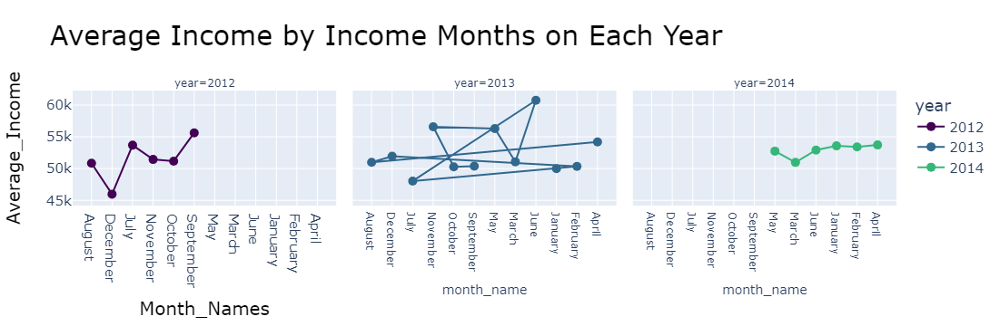

In [83]:
viridis_colors = px.colors.sequential.Viridis
selected_colors = [viridis_colors[0], viridis_colors[3], viridis_colors[6]]
color_discrete_map = {
    2012: selected_colors[0],
    2013: selected_colors[1],
    2014: selected_colors[2]
}
fig=px.line(data_frame=sorted_df , x = 'month_name' , y ='income$' ,color='year'  , markers=True,
                         title='Average Income by Income Months on Each Year', color_discrete_map=color_discrete_map,facet_col='year')
fig.update_traces(marker=dict(size=10, symbol='circle'), textposition='top center', textfont=dict(size=12))
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title='Month_Names',xaxis_title_font=dict(size=20, color='black'),
                  yaxis_title='Average_Income',yaxis_title_font=dict(size=20, color='black'),legend=dict(font=dict(size=15)),
                  xaxis=dict(tickfont=dict(size=15)),yaxis=dict(tickfont=dict(size=15)))

fig.show()       

In [84]:
sorted_dff=avg_income_year_month.sort_values(by='income$',ascending = False)
sorted_dff

,year,month_name,income$
12,2013,June,60746.0
15,2013,November,56586.0
14,2013,May,56302.0
5,2012,September,55624.0
6,2013,April,54195.0
18,2014,April,53717.0
2,2012,July,53680.0
20,2014,January,53570.0
19,2014,February,53418.0
21,2014,June,52918.0


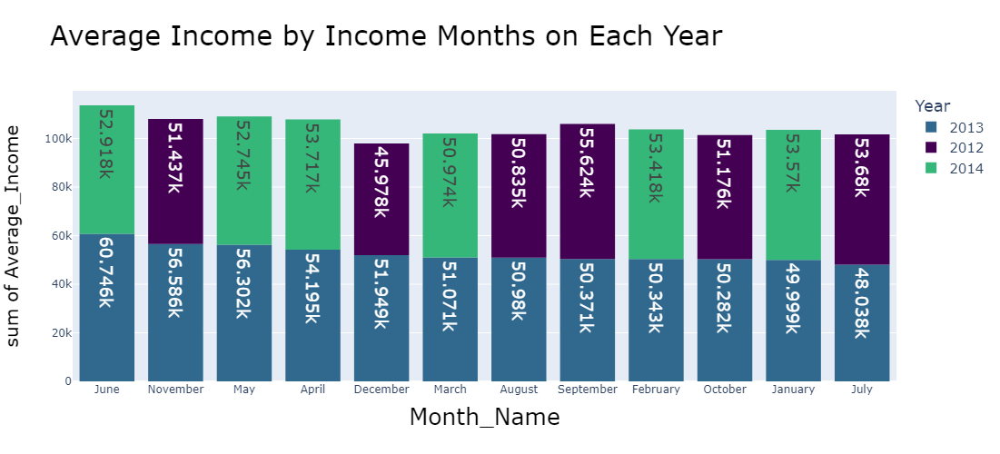

In [85]:
viridis_colors = px.colors.sequential.Viridis
selected_colors = [viridis_colors[0], viridis_colors[3], viridis_colors[6]]
color_discrete_map = {
    2012: selected_colors[0],
    2013: selected_colors[1],
    2014: selected_colors[2]
}
fig = px.histogram(data_frame=sorted_dff,x='month_name',y='income$',title='Average Income by Income Months on Each Year',
             labels={'year': 'Year', 'income$': 'Average_Income','month_name':'Month_Name'},height=500,width=900,color='year',
                 color_discrete_map=color_discrete_map,text_auto=True,)
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))

### What Are the Total Revenue for Each Year?

In [86]:
product_columns = ['mntwines', 'mntfruits', 'mntmeatproducts', 'mntfishproducts', 'mntsweetproducts', 'mntgoldprods']
total_spent = df.groupby('year')[product_columns].sum().reset_index().round(0)
total_spent

,year,mntwines,mntfruits,mntmeatproducts,mntfishproducts,mntsweetproducts,mntgoldprods
0,2012,191747.0,14678.0,97527.0,21966.0,15781.0,26146.0
1,2013,356307.0,31110.0,196258.0,43303.0,31922.0,54607.0
2,2014,131662.0,12976.0,79558.0,18666.0,12847.0,17563.0


In [87]:
total_spent_long = pd.melt(total_spent, id_vars=['year'], var_name='product', value_name='revenue')
total_spent_long

,year,product,revenue
0,2012,mntwines,191747.0
1,2013,mntwines,356307.0
2,2014,mntwines,131662.0
3,2012,mntfruits,14678.0
4,2013,mntfruits,31110.0
5,2014,mntfruits,12976.0
6,2012,mntmeatproducts,97527.0
7,2013,mntmeatproducts,196258.0
8,2014,mntmeatproducts,79558.0
9,2012,mntfishproducts,21966.0


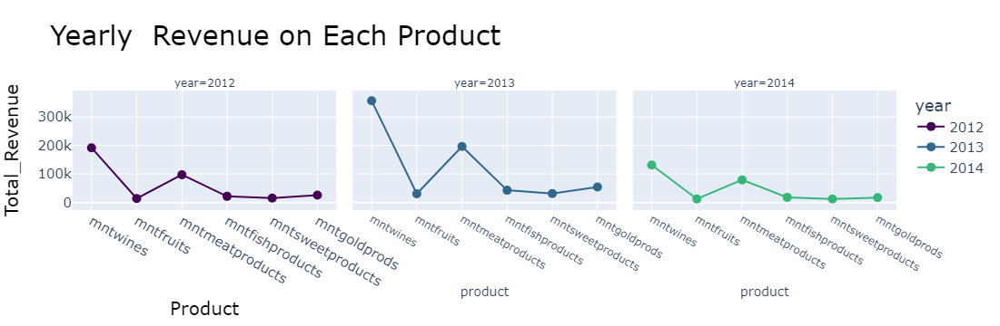

In [88]:
viridis_colors = px.colors.sequential.Viridis
selected_colors = [viridis_colors[0], viridis_colors[3], viridis_colors[6]]
color_discrete_map = {
    2012: selected_colors[0],
    2013: selected_colors[1],
    2014: selected_colors[2]
}
fig=px.line(data_frame=total_spent_long, x = 'product' , y ='revenue' ,color='year'  , markers=True,
                         title='Yearly  Revenue on Each Product', color_discrete_map=color_discrete_map,facet_col='year')
fig.update_traces(marker=dict(size=10, symbol='circle'), textposition='top center', textfont=dict(size=12))
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title='Product',xaxis_title_font=dict(size=20, color='black'),
                  yaxis_title='Total_Revenue',yaxis_title_font=dict(size=20, color='black'),legend=dict(font=dict(size=15)),
                  xaxis=dict(tickfont=dict(size=15)),yaxis=dict(tickfont=dict(size=15)))

fig.show()  

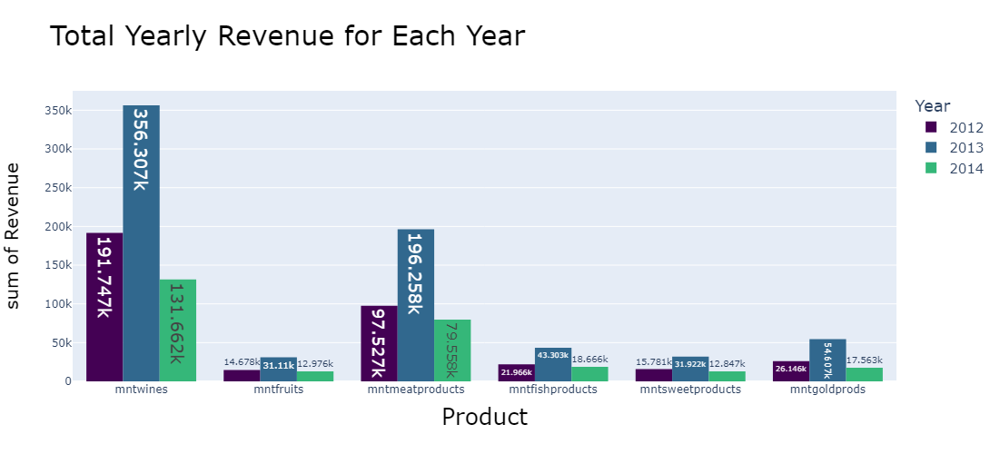

In [89]:
viridis_colors = px.colors.sequential.Viridis
selected_colors = [viridis_colors[0], viridis_colors[3], viridis_colors[6]]
color_discrete_map = {
    2012: selected_colors[0],
    2013: selected_colors[1],
    2014: selected_colors[2]
}
fig = px.histogram(data_frame=total_spent_long,x='product',y='revenue',title='Total Yearly Revenue for Each Year',
             labels={'year': 'Year', 'revenue': 'Revenue','product':'Product'},height=500,width=900,color='year',
                 color_discrete_map=color_discrete_map,text_auto=True,barmode='group')
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))

### What Are the Total Revenue for Each Month?

In [90]:
product_columns = ['mntwines', 'mntfruits', 'mntmeatproducts', 'mntfishproducts', 'mntsweetproducts', 'mntgoldprods']
total_spent_month = df.groupby('month_name')[product_columns].sum().reset_index().round(0)
total_spent_month

,month_name,mntwines,mntfruits,mntmeatproducts,mntfishproducts,mntsweetproducts,mntgoldprods
0,April,47501.0,4521.0,31776.0,6714.0,5053.0,7508.0
1,August,75264.0,5954.0,41467.0,8458.0,5890.0,10406.0
2,December,46963.0,5090.0,26607.0,6234.0,4482.0,7461.0
3,February,54608.0,4668.0,30656.0,7871.0,5619.0,8427.0
4,January,58812.0,6640.0,32489.0,7891.0,5761.0,8690.0
5,July,27542.0,2091.0,12284.0,2913.0,2162.0,4351.0
6,June,39647.0,3832.0,23200.0,5433.0,3743.0,6937.0
7,March,61533.0,4614.0,30694.0,5987.0,4212.0,7529.0
8,May,62255.0,5387.0,37446.0,8409.0,5319.0,8764.0
9,November,70332.0,5338.0,38266.0,8162.0,6247.0,8909.0


In [91]:
total_spent_long = pd.melt(total_spent_month, id_vars=['month_name'], var_name='product', value_name='revenue')
df_sorted=total_spent_long.sort_values(by='revenue',ascending = False)
df_sorted

,month_name,product,revenue
1,August,mntwines,75264.0
10,October,mntwines,72934.0
9,November,mntwines,70332.0
11,September,mntwines,62325.0
8,May,mntwines,62255.0
...,...,...,...
18,June,mntfruits,3832.0
54,June,mntsweetproducts,3743.0
41,July,mntfishproducts,2913.0
53,July,mntsweetproducts,2162.0


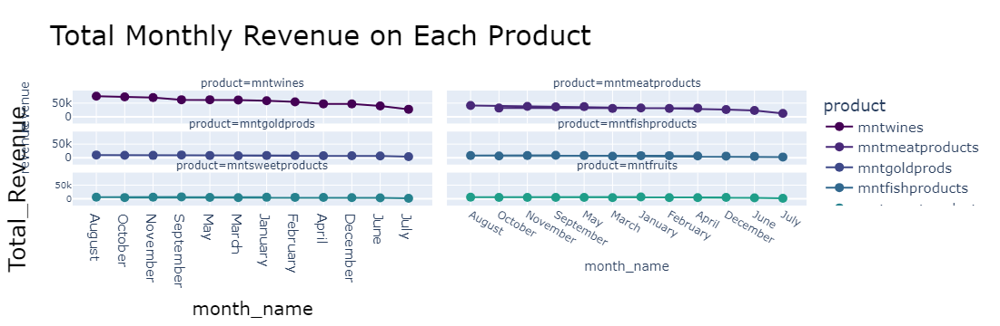

In [92]:
viridis_colors = px.colors.sequential.Viridis
fig=px.line(data_frame=df_sorted, x = 'month_name' , y ='revenue' ,color='product' , markers=True,
            title='Total Monthly Revenue on Each Product', color_discrete_sequence=viridis_colors,
            facet_col='product',facet_col_wrap=2)
fig.update_traces(marker=dict(size=10, symbol='circle'), textposition='top center', textfont=dict(size=12))
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=20, color='black'),
                  yaxis_title='Total_Revenue',yaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  xaxis=dict(tickfont=dict(size=15)),yaxis=dict(tickfont=dict(size=10)))

fig.show()  

### What Are the Total Revenue for Each Day?

In [93]:
product_columns = ['mntwines', 'mntfruits', 'mntmeatproducts', 'mntfishproducts', 'mntsweetproducts', 'mntgoldprods']
total_spent_day = df.groupby('day_name')[product_columns].sum().reset_index().round(0)
total_spent_day

,day_name,mntwines,mntfruits,mntmeatproducts,mntfishproducts,mntsweetproducts,mntgoldprods
0,Friday,108764.0,8906.0,57826.0,13987.0,9429.0,16598.0
1,Monday,106894.0,9034.0,62941.0,15268.0,9433.0,16088.0
2,Saturday,100627.0,8283.0,56931.0,11446.0,8287.0,13287.0
3,Sunday,86648.0,9030.0,49443.0,10075.0,7975.0,12716.0
4,Thursday,82904.0,7445.0,44030.0,9964.0,7813.0,13480.0
5,Tuesday,87669.0,6631.0,45172.0,9497.0,7516.0,10626.0
6,Wednesday,106210.0,9435.0,57000.0,13698.0,10097.0,15521.0


In [94]:
total_spent_long = pd.melt(total_spent_day, id_vars=['day_name'], var_name='product', value_name='revenue')
df_sorted=total_spent_long.sort_values(by='revenue',ascending = False)
df_sorted

,day_name,product,revenue
0,Friday,mntwines,108764.0
1,Monday,mntwines,106894.0
6,Wednesday,mntwines,106210.0
2,Saturday,mntwines,100627.0
5,Tuesday,mntwines,87669.0
3,Sunday,mntwines,86648.0
4,Thursday,mntwines,82904.0
15,Monday,mntmeatproducts,62941.0
14,Friday,mntmeatproducts,57826.0
20,Wednesday,mntmeatproducts,57000.0


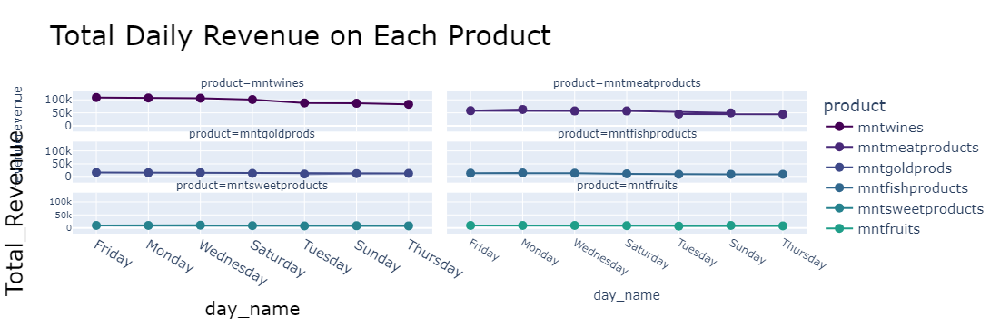

In [95]:
viridis_colors = px.colors.sequential.Viridis
fig=px.line(data_frame=df_sorted, x = 'day_name' , y ='revenue' ,color='product' , markers=True,
            title='Total Daily Revenue on Each Product', color_discrete_sequence=viridis_colors,
            facet_col='product',facet_col_wrap=2)
fig.update_traces(marker=dict(size=10, symbol='circle'), textposition='top center', textfont=dict(size=12))
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=20, color='black'),
                  yaxis_title='Total_Revenue',yaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  xaxis=dict(tickfont=dict(size=15)),yaxis=dict(tickfont=dict(size=10)))

fig.show() 

### What Are the Total Revenue for Each Quarter?

In [96]:
product_columns = ['mntwines', 'mntfruits', 'mntmeatproducts', 'mntfishproducts', 'mntsweetproducts', 'mntgoldprods']
total_spent_quarter = df.groupby('quarter')[product_columns].sum().reset_index().round(0)
total_spent_quarter

,quarter,mntwines,mntfruits,mntmeatproducts,mntfishproducts,mntsweetproducts,mntgoldprods
0,1,174953.0,15922.0,93839.0,21749.0,15592.0,24646.0
1,2,149403.0,13740.0,92422.0,20556.0,14115.0,23209.0
2,3,165131.0,13409.0,90327.0,20440.0,15318.0,25163.0
3,4,190229.0,15693.0,96755.0,21190.0,15525.0,25298.0


In [97]:
total_spent_long = pd.melt(total_spent_quarter, id_vars=['quarter'], var_name='product', value_name='revenue')
df_sorted=total_spent_long.sort_values(by='revenue',ascending = False)
df_sorted

,quarter,product,revenue
3,4,mntwines,190229.0
0,1,mntwines,174953.0
2,3,mntwines,165131.0
1,2,mntwines,149403.0
11,4,mntmeatproducts,96755.0
8,1,mntmeatproducts,93839.0
9,2,mntmeatproducts,92422.0
10,3,mntmeatproducts,90327.0
23,4,mntgoldprods,25298.0
22,3,mntgoldprods,25163.0


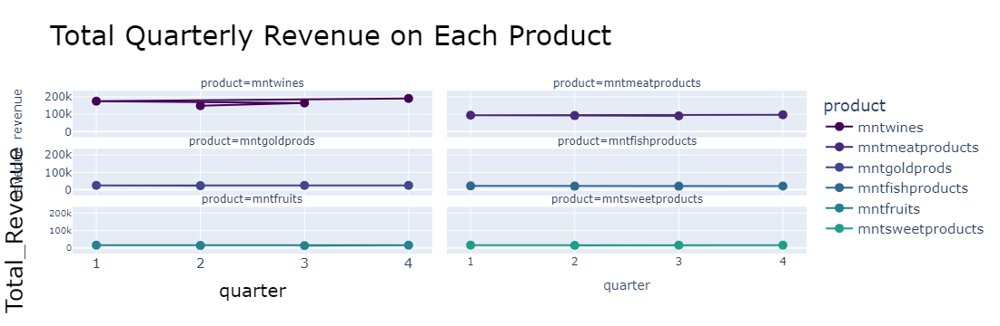

In [98]:
viridis_colors = px.colors.sequential.Viridis
fig=px.line(data_frame=df_sorted, x = 'quarter' , y ='revenue' ,color='product' , markers=True,
            title='Total Quarterly Revenue on Each Product', color_discrete_sequence=viridis_colors,
            facet_col='product',facet_col_wrap=2)
fig.update_traces(marker=dict(size=10, symbol='circle'), textposition='top center', textfont=dict(size=12))
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=20, color='black'),
                  yaxis_title='Total_Revenue',yaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  xaxis=dict(tickfont=dict(size=15)),yaxis=dict(tickfont=dict(size=10)))

fig.show() 

### what are the Yearly Revenue for each Quarter?

In [280]:
product_columns = ['mntwines', 'mntfruits', 'mntmeatproducts', 'mntfishproducts', 'mntsweetproducts', 'mntgoldprods']
avg_Revenue_year = df.groupby(['year','quarter'])[product_columns].sum().reset_index().round(0)
avg_Revenue_year

,year,quarter,mntwines,mntfruits,mntmeatproducts,mntfishproducts,mntsweetproducts,mntgoldprods
0,2012,3,86958.0,7518.0,51900.0,11238.0,8175.0,13106.0
1,2012,4,104789.0,7160.0,45627.0,10728.0,7606.0,13040.0
2,2013,1,105765.0,9509.0,53995.0,13000.0,9212.0,16071.0
3,2013,2,86929.0,7177.0,52708.0,10639.0,7648.0,14221.0
4,2013,3,78173.0,5891.0,38427.0,9202.0,7143.0,12057.0
5,2013,4,85440.0,8533.0,51128.0,10462.0,7919.0,12258.0
6,2014,1,69188.0,6413.0,39844.0,8749.0,6380.0,8575.0
7,2014,2,62474.0,6563.0,39714.0,9917.0,6467.0,8988.0


In [281]:
total_spent_long = pd.melt(avg_Revenue_year, id_vars=(['quarter','year']), var_name='product', value_name='revenue')
df_sorted=total_spent_long.sort_values(by='revenue',ascending = False)
df_sorted

,quarter,year,product,revenue
2,1,2013,mntwines,105765.0
1,4,2012,mntwines,104789.0
0,3,2012,mntwines,86958.0
3,2,2013,mntwines,86929.0
5,4,2013,mntwines,85440.0
4,3,2013,mntwines,78173.0
6,1,2014,mntwines,69188.0
7,2,2014,mntwines,62474.0
18,1,2013,mntmeatproducts,53995.0
19,2,2013,mntmeatproducts,52708.0


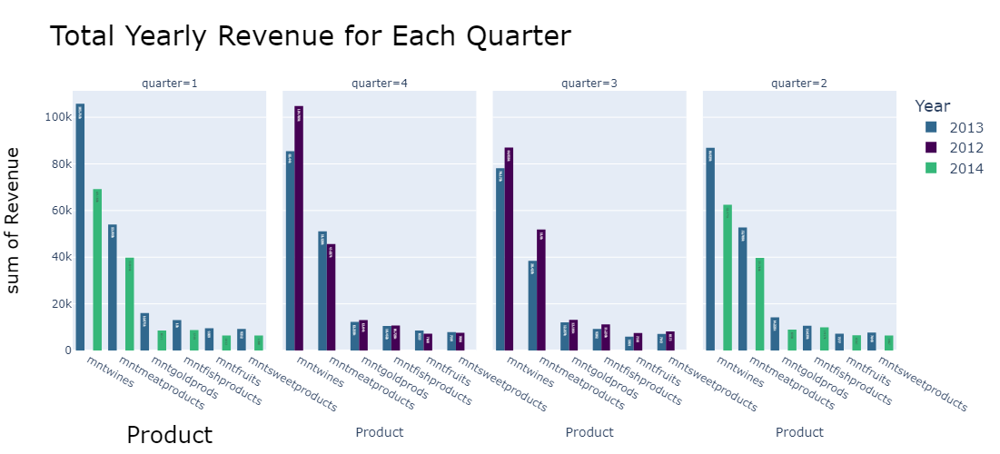

In [283]:
viridis_colors = px.colors.sequential.Viridis
selected_colors = [viridis_colors[0], viridis_colors[3], viridis_colors[6]]
color_discrete_map = {
    2012: selected_colors[0],
    2013: selected_colors[1],
    2014: selected_colors[2]
}
fig = px.histogram(data_frame=df_sorted,x='product',y='revenue',title='Total Yearly Revenue for Each Quarter',
             labels={'year': 'Year', 'revenue': 'Revenue','product':'Product'},height=500,width=900,color='year',facet_col='quarter',
                 color_discrete_map=color_discrete_map,text_auto=True,barmode='group')
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))

### What are the Total Revenue for all Product by Each Year?

In [102]:
df['total_revenue'] = df[product_columns].sum(axis=1)

In [103]:
total_revenue_per_year = df.groupby('year')['total_revenue'].sum().reset_index()
total_revenue_per_year

,year,total_revenue
0,2012,367845.0
1,2013,713507.0
2,2014,273272.0


In [104]:
total_revenue_per_year['year'] = total_revenue_per_year['year'].astype(str)
total_revenue_per_year

,year,total_revenue
0,2012,367845.0
1,2013,713507.0
2,2014,273272.0


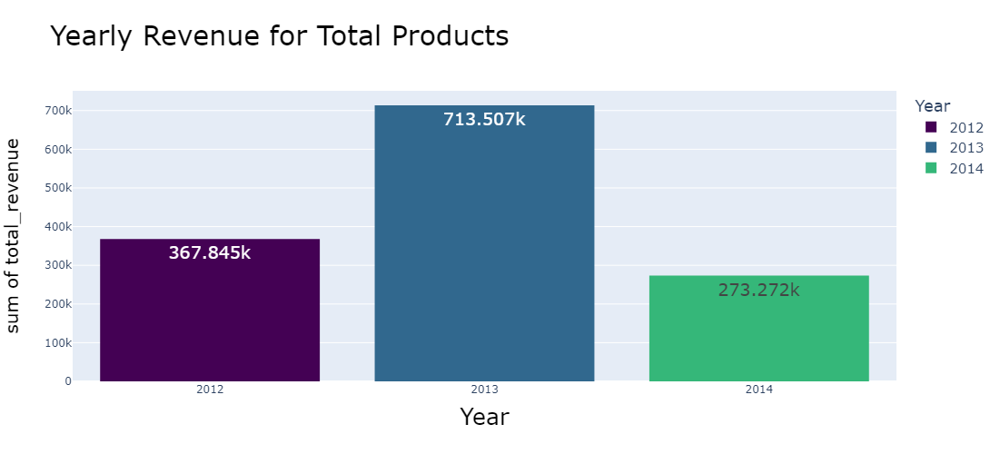

In [105]:
viridis_colors = px.colors.sequential.Viridis
selected_colors = [viridis_colors[0], viridis_colors[3], viridis_colors[6]]
color_discrete_map = {
    '2012': selected_colors[0],
    '2013': selected_colors[1],
    '2014': selected_colors[2]
}
fig = px.histogram(data_frame=total_revenue_per_year,x='year',y='total_revenue',title='Yearly Revenue for Total Products',
             labels={'year': 'Year', 'revenue': 'Revenue','product':'Product'},height=500,width=900,color='year',
                 color_discrete_map=color_discrete_map,text_auto=True)
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))

### What are the Revenue of Each Quarter in Year 2012?

In [106]:
msk=df[df['year']==2012]
msk

,id,education,marital_status,income$,kidhome,teenhome,mntwines,mntfruits,mntmeatproducts,mntfishproducts,...,month_name,day,day_name,quarter,weekday,week_categories,season,days_of_purchases,grouped_age,total_revenue
24,10968,Graduation,Single,57731.0,0,1,266.0,21.0,300.0,65.0,...,November,23,Friday,4,4,WorkDay,Fall,Top Sellers,51-60,704.0
25,5985,Master,Single,33168.0,0,1,80.0,1.0,37.0,0.0,...,October,13,Saturday,4,5,WeekEnd,Fall,Top Sellers,51-60,122.0
26,5430,Graduation,Together,54450.0,1,1,454.0,0.0,171.0,8.0,...,September,14,Friday,3,4,WorkDay,Fall,Top Sellers,61-70,684.0
27,8432,Graduation,Together,54450.0,1,1,454.0,0.0,171.0,8.0,...,September,14,Friday,3,4,WorkDay,Fall,Top Sellers,61-70,684.0
47,5114,Master,Married,74806.0,0,1,670.0,9.0,249.0,0.0,...,December,19,Wednesday,4,2,WorkDay,Winter,Top Sellers,51-60,965.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2218,3846,Graduation,Married,42557.0,0,1,192.0,5.0,53.0,0.0,...,August,29,Wednesday,3,2,WorkDay,Summer,Very Old,41-50,270.0
2219,10001,2n Cycle,Together,7500.0,1,0,5.0,17.0,17.0,13.0,...,August,1,Wednesday,3,2,WorkDay,Summer,Very Old,31-40,100.0
2233,22,Graduation,Divorced,46310.0,1,0,185.0,2.0,88.0,15.0,...,December,3,Monday,4,0,WorkDay,Winter,Very Old,41-50,309.0
2234,528,Graduation,Married,65819.0,0,0,267.0,38.0,701.0,149.0,...,November,29,Thursday,4,3,WorkDay,Fall,Very Old,41-50,1383.0


In [107]:
product_columns = ['mntwines', 'mntfruits', 'mntmeatproducts', 'mntfishproducts', 'mntsweetproducts', 'mntgoldprods']
avg_Revenue_quarter = msk.groupby('quarter')[product_columns].sum().reset_index().round(0)
avg_Revenue_quarter

,quarter,mntwines,mntfruits,mntmeatproducts,mntfishproducts,mntsweetproducts,mntgoldprods
0,3,86958.0,7518.0,51900.0,11238.0,8175.0,13106.0
1,4,104789.0,7160.0,45627.0,10728.0,7606.0,13040.0


In [108]:
total_spent_long = pd.melt(avg_Revenue_quarter, id_vars=('quarter'), var_name='product', value_name='revenue')
df_sorted=total_spent_long.sort_values(by='revenue',ascending = False)
df_sorted

,quarter,product,revenue
1,4,mntwines,104789.0
0,3,mntwines,86958.0
4,3,mntmeatproducts,51900.0
5,4,mntmeatproducts,45627.0
10,3,mntgoldprods,13106.0
11,4,mntgoldprods,13040.0
6,3,mntfishproducts,11238.0
7,4,mntfishproducts,10728.0
8,3,mntsweetproducts,8175.0
9,4,mntsweetproducts,7606.0


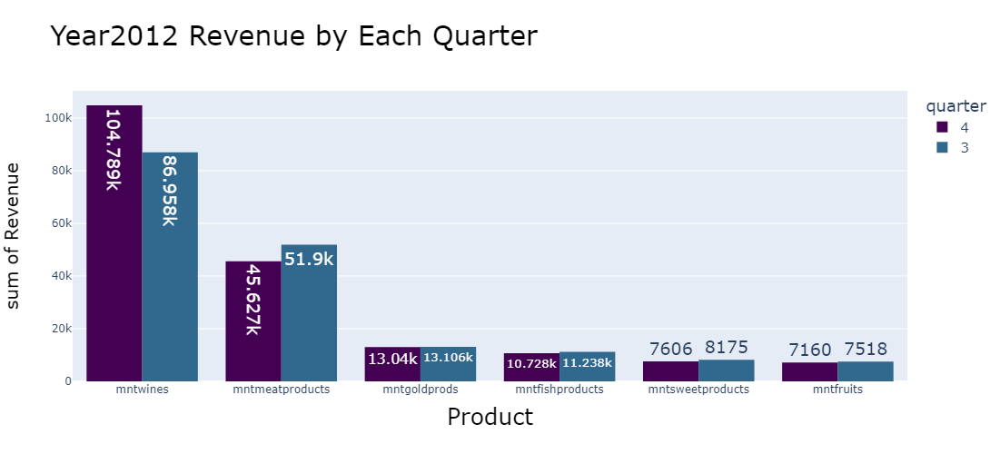

In [109]:
viridis_colors = px.colors.sequential.Viridis
selected_colors = [viridis_colors[0], viridis_colors[3], viridis_colors[6]]
color_discrete_map = {
    4: selected_colors[0],
    3: selected_colors[1]
}
fig = px.histogram(data_frame=df_sorted,x='product',y='revenue',title='Year2012 Revenue by Each Quarter',
             labels={'year': 'Year', 'revenue': 'Revenue','product':'Product'},height=500,width=900,color='quarter',
                 color_discrete_map=color_discrete_map,text_auto=True,barmode='group')
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))

### what are the total Revenue for all product by each Quarter?

In [110]:
df['total_revenue'] = df[product_columns].sum(axis=1)

In [111]:
total_revenue_per_quarter = msk.groupby('quarter')['total_revenue'].sum().reset_index()
total_revenue_per_quarter['quarter']=total_revenue_per_quarter['quarter'].astype(str)
total_revenue_per_quarter

,quarter,total_revenue
0,3,178895.0
1,4,188950.0


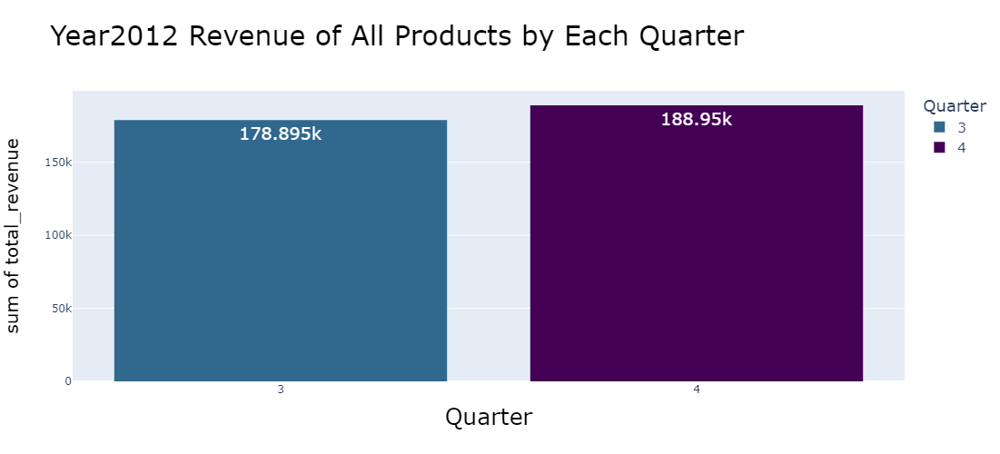

In [112]:
viridis_colors = px.colors.sequential.Viridis
selected_colors = [viridis_colors[0], viridis_colors[3], viridis_colors[6]]
color_discrete_map = {
    '4': selected_colors[0],
    '3': selected_colors[1]
}
fig = px.histogram(data_frame=total_revenue_per_quarter,x='quarter',y='total_revenue',title='Year2012 Revenue of All Products by Each Quarter',
             labels={'quarter': 'Quarter', 'revenue': 'Revenue'},height=500,width=900,color='quarter',
                 color_discrete_map=color_discrete_map,text_auto=True)
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))

### What are the Revenue of 2012 by Each Month?

In [113]:
product_columns = ['mntwines', 'mntfruits', 'mntmeatproducts', 'mntfishproducts', 'mntsweetproducts', 'mntgoldprods']
avg_Revenue_month = msk.groupby('month_name')[product_columns].sum().reset_index().round(0)
avg_Revenue_month

,month_name,mntwines,mntfruits,mntmeatproducts,mntfishproducts,mntsweetproducts,mntgoldprods
0,August,45488.0,3892.0,26764.0,5412.0,3779.0,6711.0
1,December,25467.0,2321.0,11039.0,2806.0,2225.0,3524.0
2,July,781.0,21.0,325.0,60.0,119.0,51.0
3,November,41330.0,2368.0,19375.0,5136.0,3475.0,5506.0
4,October,37992.0,2471.0,15213.0,2786.0,1906.0,4010.0
5,September,40689.0,3605.0,24811.0,5766.0,4277.0,6344.0


In [114]:
total_spent_long = pd.melt(avg_Revenue_month, id_vars=('month_name'), var_name='product', value_name='revenue')
df_sorted=total_spent_long.sort_values(by='revenue',ascending = False)
df_sorted

,month_name,product,revenue
0,August,mntwines,45488.0
3,November,mntwines,41330.0
5,September,mntwines,40689.0
4,October,mntwines,37992.0
12,August,mntmeatproducts,26764.0
1,December,mntwines,25467.0
17,September,mntmeatproducts,24811.0
15,November,mntmeatproducts,19375.0
16,October,mntmeatproducts,15213.0
13,December,mntmeatproducts,11039.0


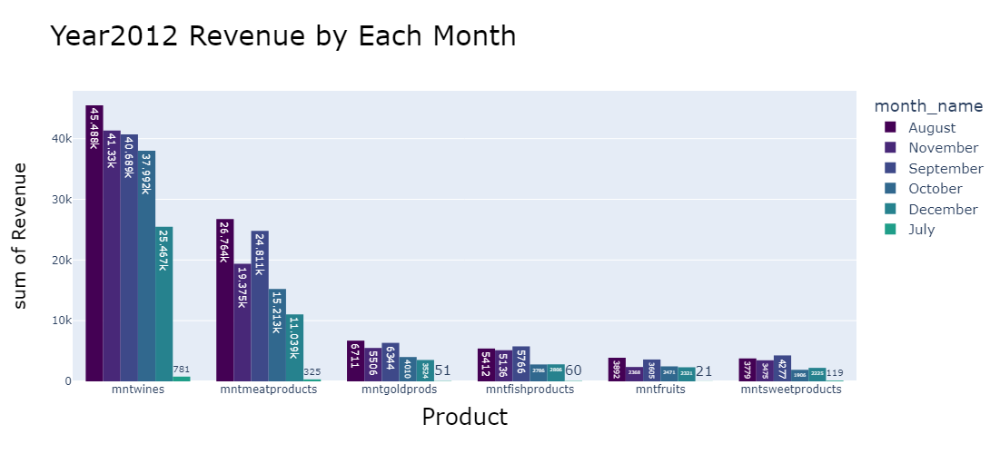

In [115]:
fig = px.histogram(data_frame=df_sorted,x='product',y='revenue',title='Year2012 Revenue by Each Month',
             labels={ 'revenue': 'Revenue','product':'Product'},height=500,width=900,color='month_name',
                 color_discrete_sequence=px.colors.sequential.Viridis,text_auto=True,barmode='group')
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))

### What are the total Revenue for all Products by Each month?

In [116]:
df['total_revenue'] = df[product_columns].sum(axis=1)

In [117]:
total_revenue_month = msk.groupby('month_name')['total_revenue'].sum().reset_index().round(0).sort_values(by="total_revenue",ascending = False)
total_revenue_month

,month_name,total_revenue
0,August,92046.0
5,September,85492.0
3,November,77190.0
4,October,64378.0
1,December,47382.0
2,July,1357.0


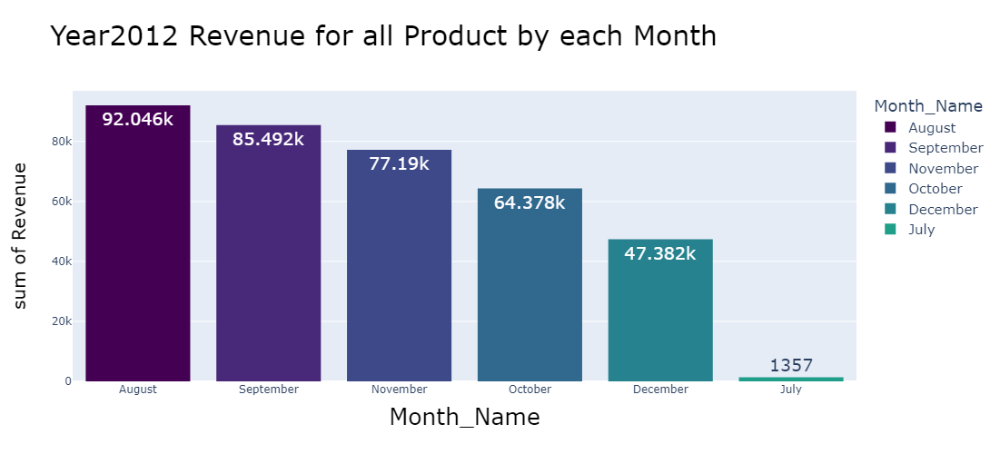

In [118]:
fig = px.histogram(data_frame=total_revenue_month,x='month_name',y='total_revenue',title='Year2012 Revenue for all Product by each Month',
             labels={ 'total_revenue': 'Revenue','month_name':'Month_Name'},height=500,width=900,color='month_name',
                 color_discrete_sequence=px.colors.sequential.Viridis,text_auto=True)
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))

## What Are the revenue of year 2012 by each season?

In [119]:
product_columns = ['mntwines', 'mntfruits', 'mntmeatproducts', 'mntfishproducts', 'mntsweetproducts', 'mntgoldprods']
avg_Revenue_season = msk.groupby('season')[product_columns].sum().reset_index().round(0)
avg_Revenue_season

,season,mntwines,mntfruits,mntmeatproducts,mntfishproducts,mntsweetproducts,mntgoldprods
0,Fall,120011.0,8444.0,59399.0,13688.0,9658.0,15860.0
1,Summer,46269.0,3913.0,27089.0,5472.0,3898.0,6762.0
2,Winter,25467.0,2321.0,11039.0,2806.0,2225.0,3524.0


In [120]:
total_spent_long = pd.melt(avg_Revenue_season, id_vars=('season'), var_name='product', value_name='revenue')
df_sorted=total_spent_long.sort_values(by='revenue',ascending = False)
df_sorted

,season,product,revenue
0,Fall,mntwines,120011.0
6,Fall,mntmeatproducts,59399.0
1,Summer,mntwines,46269.0
7,Summer,mntmeatproducts,27089.0
2,Winter,mntwines,25467.0
15,Fall,mntgoldprods,15860.0
9,Fall,mntfishproducts,13688.0
8,Winter,mntmeatproducts,11039.0
12,Fall,mntsweetproducts,9658.0
3,Fall,mntfruits,8444.0


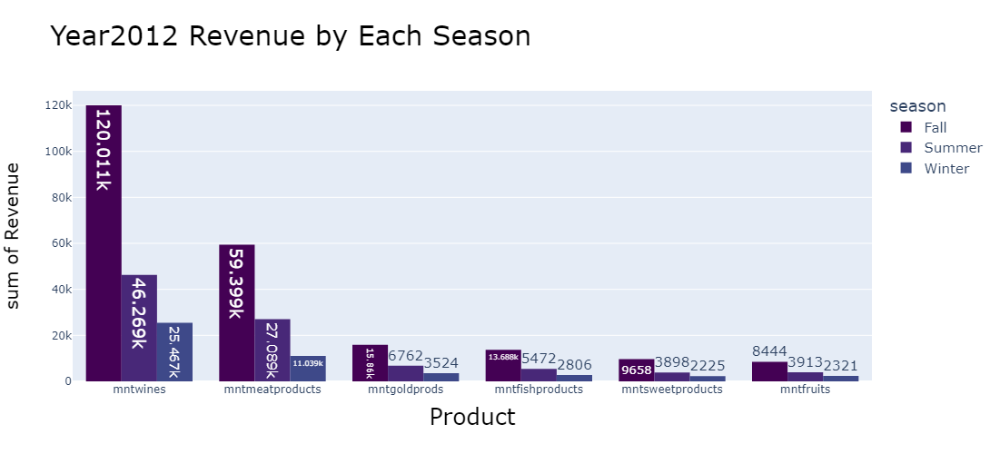

In [121]:
fig = px.histogram(data_frame=df_sorted,x='product',y='revenue',title='Year2012 Revenue by Each Season',
             labels={ 'revenue': 'Revenue','product':'Product'},height=500,width=900,color='season',
                 color_discrete_sequence=px.colors.sequential.Viridis,text_auto=True,barmode='group')
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))

### What are the Total Revenue for all Products in Each Season?

In [122]:
df['total_revenue'] = df[product_columns].sum(axis=1)

In [123]:
total_Revenue_season = msk.groupby('season')['total_revenue'].sum().reset_index().round(0)
total_Revenue_season

,season,total_revenue
0,Fall,227060.0
1,Summer,93403.0
2,Winter,47382.0


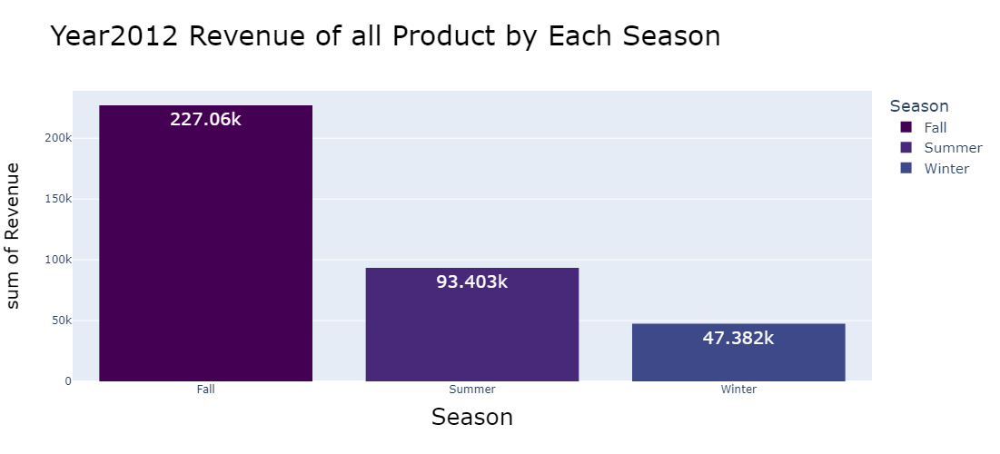

In [124]:
fig = px.histogram(data_frame=total_Revenue_season,x='season',y='total_revenue',title='Year2012 Revenue of all Product by Each Season',
             labels={ 'total_revenue': 'Revenue','season':'Season'},height=500,width=900,color='season',
                 color_discrete_sequence=px.colors.sequential.Viridis,text_auto=True)
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))

### What are the total Revenue for each Day?

In [125]:
product_columns = ['mntwines', 'mntfruits', 'mntmeatproducts', 'mntfishproducts', 'mntsweetproducts', 'mntgoldprods']
avg_Revenue_day = msk.groupby('day_name')[product_columns].sum().reset_index().round(0)
avg_Revenue_day

,day_name,mntwines,mntfruits,mntmeatproducts,mntfishproducts,mntsweetproducts,mntgoldprods
0,Friday,38269.0,3009.0,20706.0,4582.0,3133.0,5804.0
1,Monday,29475.0,1596.0,13869.0,2668.0,1605.0,3515.0
2,Saturday,30552.0,1744.0,16772.0,3298.0,2685.0,4079.0
3,Sunday,25682.0,2465.0,11610.0,2085.0,1996.0,2633.0
4,Thursday,18121.0,1611.0,6732.0,2003.0,1509.0,2625.0
5,Tuesday,20584.0,1548.0,11270.0,3040.0,2169.0,3073.0
6,Wednesday,29064.0,2705.0,16568.0,4290.0,2684.0,4417.0


In [126]:
total_spent_long = pd.melt(avg_Revenue_day, id_vars=('day_name'), var_name='product', value_name='revenue')
df_sorted=total_spent_long.sort_values(by='revenue',ascending = False)
df_sorted

,day_name,product,revenue
0,Friday,mntwines,38269.0
2,Saturday,mntwines,30552.0
1,Monday,mntwines,29475.0
6,Wednesday,mntwines,29064.0
3,Sunday,mntwines,25682.0
14,Friday,mntmeatproducts,20706.0
5,Tuesday,mntwines,20584.0
4,Thursday,mntwines,18121.0
16,Saturday,mntmeatproducts,16772.0
20,Wednesday,mntmeatproducts,16568.0


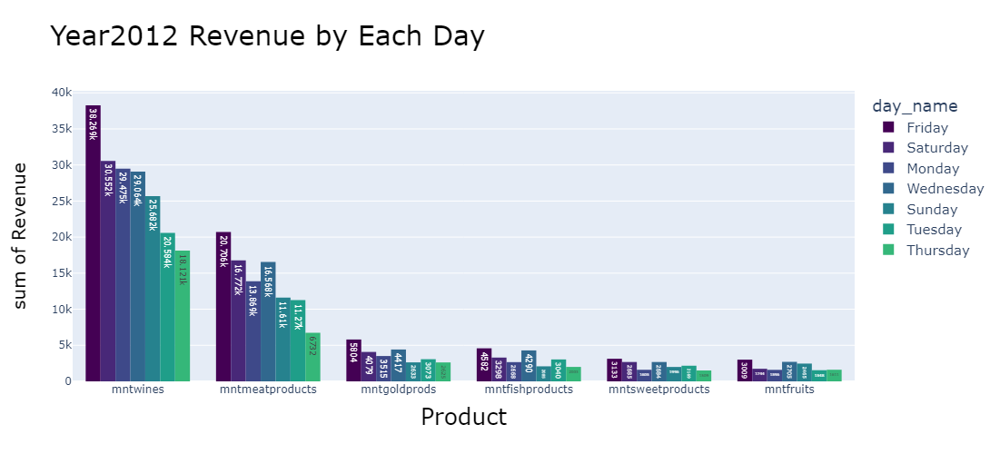

In [127]:
fig = px.histogram(data_frame=df_sorted,x='product',y='revenue',title='Year2012 Revenue by Each Day',
             labels={ 'revenue': 'Revenue','product':'Product'},height=500,width=900,color='day_name',
                 color_discrete_sequence=px.colors.sequential.Viridis,text_auto=True,barmode='group')
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))

### What are the Total Revenue for all Products in Each Day?

In [128]:
df['total_revenue'] = df[product_columns].sum(axis=1)

In [129]:
total_Revenue_day = msk.groupby('day_name')['total_revenue'].sum().reset_index().round(0)
df_sorted=total_Revenue_day.sort_values(by='total_revenue', ascending = False)
df_sorted

,day_name,total_revenue
0,Friday,75503.0
6,Wednesday,59728.0
2,Saturday,59130.0
1,Monday,52728.0
3,Sunday,46471.0
5,Tuesday,41684.0
4,Thursday,32601.0


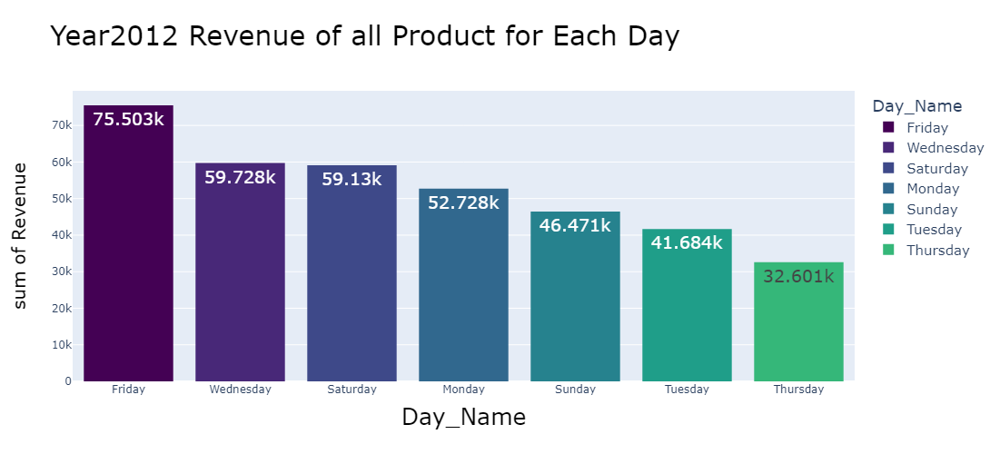

In [130]:
fig = px.histogram(data_frame=df_sorted,x='day_name',y='total_revenue',title='Year2012 Revenue of all Product for Each Day',
             labels={ 'total_revenue': 'Revenue','day_name':'Day_Name'},height=500,width=900,color='day_name',
                 color_discrete_sequence=px.colors.sequential.Viridis,text_auto=True)
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))

### What are the total Revenue for year 2013 by Each Quarter?


In [131]:
msk1=df[df['year']==2013]
msk1

,id,education,marital_status,income$,kidhome,teenhome,mntwines,mntfruits,mntmeatproducts,mntfishproducts,...,month_name,day,day_name,quarter,weekday,week_categories,season,days_of_purchases,grouped_age,total_revenue
10,2079,2n Cycle,Married,81044.0,0,0,450.0,26.0,535.0,73.0,...,December,27,Friday,4,4,WorkDay,Winter,Top Sellers,71-80,1208.0
11,5642,Master,Together,62499.0,1,0,140.0,4.0,61.0,0.0,...,December,9,Monday,4,0,WorkDay,Winter,Top Sellers,41-50,222.0
12,10530,PhD,Widow,67786.0,0,0,431.0,82.0,441.0,80.0,...,December,7,Saturday,4,5,WeekEnd,Winter,Top Sellers,61-70,1156.0
13,2964,Graduation,Married,26872.0,0,0,3.0,10.0,8.0,3.0,...,October,16,Wednesday,4,2,WorkDay,Fall,Top Sellers,41-50,72.0
14,10311,Graduation,Married,4428.0,0,1,16.0,4.0,12.0,2.0,...,October,5,Saturday,4,5,WeekEnd,Fall,Top Sellers,51-60,359.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2210,5602,PhD,Together,66973.0,0,0,466.0,22.0,432.0,147.0,...,May,17,Friday,2,4,WorkDay,Spring,Very Old,31-40,1282.0
2211,2202,Graduation,Together,41154.0,0,1,44.0,2.0,11.0,2.0,...,April,9,Tuesday,2,1,WorkDay,Spring,Very Old,41-50,69.0
2230,9977,Graduation,Divorced,78901.0,0,1,321.0,11.0,309.0,33.0,...,September,17,Tuesday,3,1,WorkDay,Fall,Very Old,51-60,734.0
2231,10142,PhD,Divorced,66476.0,0,1,372.0,18.0,126.0,47.0,...,March,7,Thursday,1,3,WorkDay,Spring,Very Old,41-50,689.0


In [132]:
df['total_revenue'] = df[product_columns].sum(axis=1)

In [133]:
total_revenue_quarter = msk1.groupby('quarter')['total_revenue'].sum().reset_index().round(0)
df_sorted=total_revenue_quarter.sort_values(by='total_revenue', ascending = False).astype(str)
df_sorted

,quarter,total_revenue
0,1,207552.0
1,2,179322.0
3,4,175740.0
2,3,150893.0


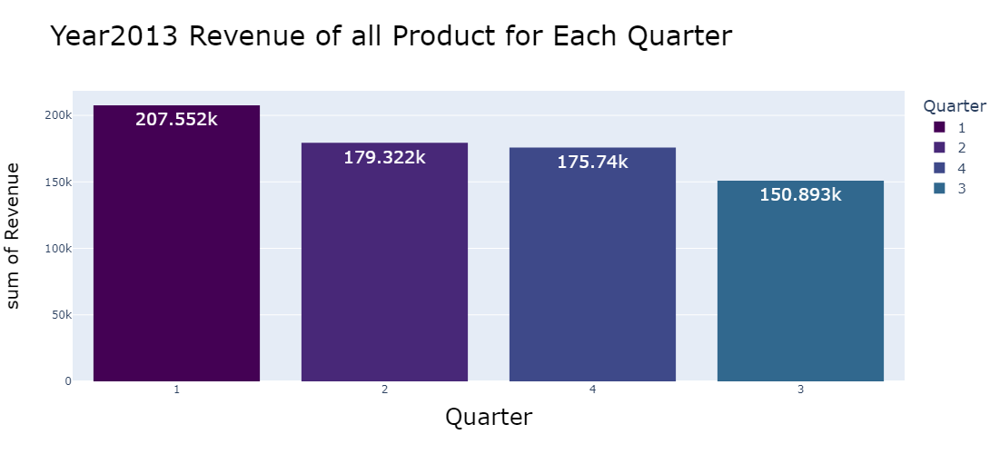

In [134]:
fig = px.histogram(data_frame=df_sorted,x='quarter',y='total_revenue',title='Year2013 Revenue of all Product for Each Quarter',
             labels={ 'total_revenue': 'Revenue','quarter':'Quarter'},height=500,width=900,color='quarter',
                 color_discrete_sequence=px.colors.sequential.Viridis,text_auto=True)
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))

### What are the total Revenue for each Product for year 2013 by Each Quarter?


In [135]:
product_columns = ['mntwines', 'mntfruits', 'mntmeatproducts', 'mntfishproducts', 'mntsweetproducts', 'mntgoldprods']
total_Revenue_quarter = msk1.groupby('quarter')[product_columns].sum().reset_index().round(0)
total_Revenue_quarter

,quarter,mntwines,mntfruits,mntmeatproducts,mntfishproducts,mntsweetproducts,mntgoldprods
0,1,105765.0,9509.0,53995.0,13000.0,9212.0,16071.0
1,2,86929.0,7177.0,52708.0,10639.0,7648.0,14221.0
2,3,78173.0,5891.0,38427.0,9202.0,7143.0,12057.0
3,4,85440.0,8533.0,51128.0,10462.0,7919.0,12258.0


In [136]:
total_spent_long = pd.melt(total_Revenue_quarter, id_vars=('quarter'), var_name='product', value_name='revenue')
df_sorted=total_spent_long.sort_values(by='revenue',ascending = False)
df_sorted

,quarter,product,revenue
0,1,mntwines,105765.0
1,2,mntwines,86929.0
3,4,mntwines,85440.0
2,3,mntwines,78173.0
8,1,mntmeatproducts,53995.0
9,2,mntmeatproducts,52708.0
11,4,mntmeatproducts,51128.0
10,3,mntmeatproducts,38427.0
20,1,mntgoldprods,16071.0
21,2,mntgoldprods,14221.0


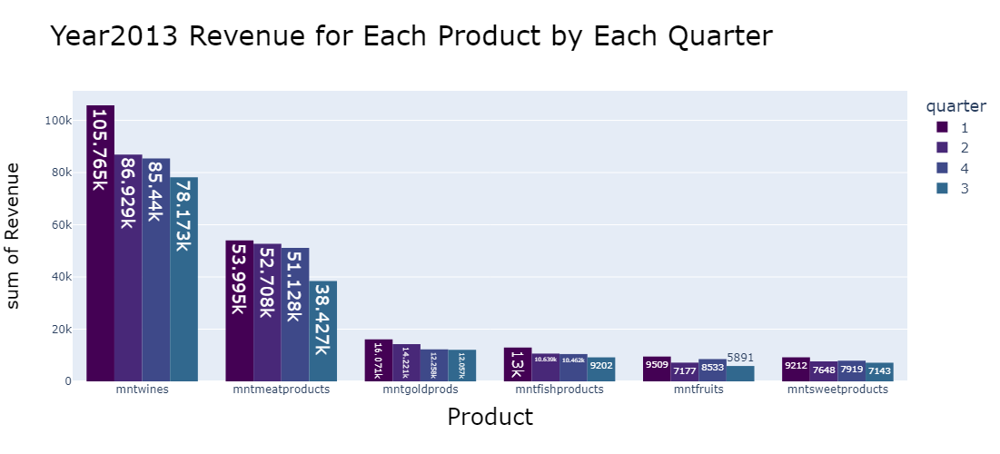

In [137]:
fig = px.histogram(data_frame=df_sorted,x='product',y='revenue',title='Year2013 Revenue for Each Product by Each Quarter',
             labels={ 'revenue': 'Revenue','product':'Product'},height=500,width=900,color='quarter',
                 color_discrete_sequence=px.colors.sequential.Viridis,text_auto=True,barmode='group')
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))

### What are the Total Revenue for all Products by Each month in Year 2013?

In [138]:
df['total_revenue'] = df[product_columns].sum(axis=1)

In [139]:
total_revenue_month = msk1.groupby('month_name')['total_revenue'].sum().reset_index().round(0)
df_sorted=total_revenue_month.sort_values(by='total_revenue', ascending = False)
df_sorted

,month_name,total_revenue
8,May,72954.0
4,January,71351.0
3,February,68879.0
7,March,67322.0
10,October,66221.0
9,November,60064.0
0,April,58135.0
1,August,55393.0
5,July,49986.0
2,December,49455.0


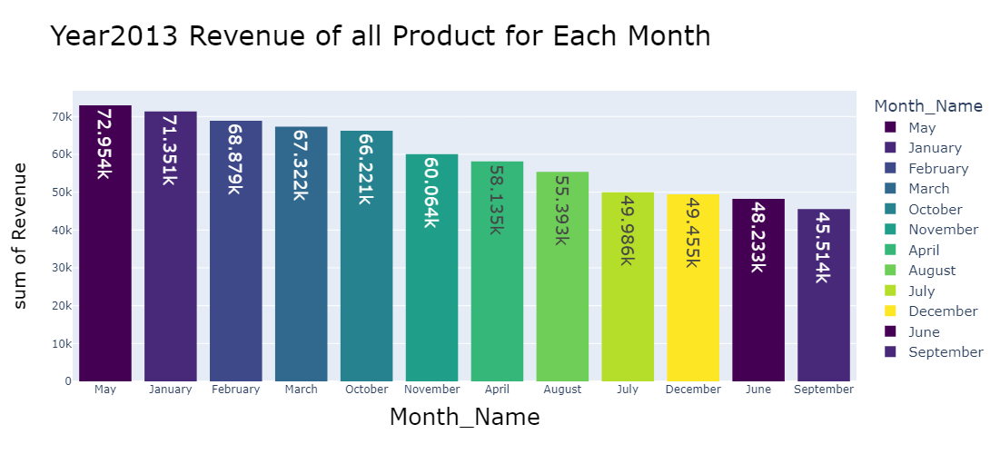

In [140]:
fig = px.histogram(data_frame=df_sorted,x='month_name',y='total_revenue',title='Year2013 Revenue of all Product for Each Month',
             labels={ 'total_revenue': 'Revenue','month_name':'Month_Name'},height=500,width=900,color='month_name',
                 color_discrete_sequence=px.colors.sequential.Viridis,text_auto=True)
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))

### Total Revenue for each product for each Month of year 2013?

In [141]:
product_columns = ['mntwines', 'mntfruits', 'mntmeatproducts', 'mntfishproducts', 'mntsweetproducts', 'mntgoldprods']
total_Revenue_month = msk1.groupby('month_name')[product_columns].sum().reset_index().round(0)
total_Revenue_month

,month_name,mntwines,mntfruits,mntmeatproducts,mntfishproducts,mntsweetproducts,mntgoldprods
0,April,26896.0,2363.0,18106.0,3333.0,2747.0,4690.0
1,August,29776.0,2062.0,14703.0,3046.0,2111.0,3695.0
2,December,21496.0,2769.0,15568.0,3428.0,2257.0,3937.0
3,February,34276.0,2698.0,17485.0,5307.0,3356.0,5757.0
4,January,36086.0,3947.0,18560.0,4068.0,3266.0,5424.0
5,July,26761.0,2070.0,11959.0,2853.0,2043.0,4300.0
6,June,22695.0,2065.0,13821.0,2902.0,2337.0,4413.0
7,March,35403.0,2864.0,17950.0,3625.0,2590.0,4890.0
8,May,37338.0,2749.0,20781.0,4404.0,2564.0,5118.0
9,November,29002.0,2970.0,18891.0,3026.0,2772.0,3403.0


In [142]:
total_spent_long = pd.melt(total_Revenue_month, id_vars=('month_name'), var_name='product', value_name='revenue')
df_sorted=total_spent_long.sort_values(by='revenue',ascending = False)
df_sorted

,month_name,product,revenue
8,May,mntwines,37338.0
4,January,mntwines,36086.0
7,March,mntwines,35403.0
10,October,mntwines,34942.0
3,February,mntwines,34276.0
...,...,...,...
17,July,mntfruits,2070.0
18,June,mntfruits,2065.0
13,August,mntfruits,2062.0
53,July,mntsweetproducts,2043.0


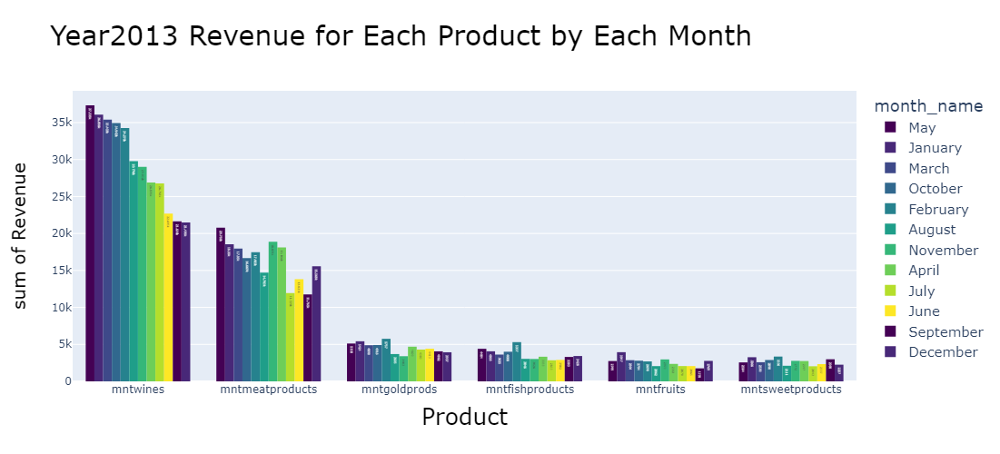

In [143]:
fig = px.histogram(data_frame=df_sorted,x='product',y='revenue',title='Year2013 Revenue for Each Product by Each Month',
             labels={ 'revenue': 'Revenue','product':'Product'},height=500,width=900,color='month_name',
                 color_discrete_sequence=px.colors.sequential.Viridis,text_auto=True,barmode='group')
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))

### What are the Total Revenue for All products in Each Day for year2013?

In [144]:
total_revenue_day = msk1.groupby('day_name')['total_revenue'].sum().reset_index().round(0)
df_sorted=total_revenue_day.sort_values(by='total_revenue', ascending = False)
df_sorted

,day_name,total_revenue
1,Monday,111608.0
6,Wednesday,111081.0
2,Saturday,101319.0
0,Friday,99879.0
3,Sunday,98994.0
4,Thursday,95938.0
5,Tuesday,94688.0


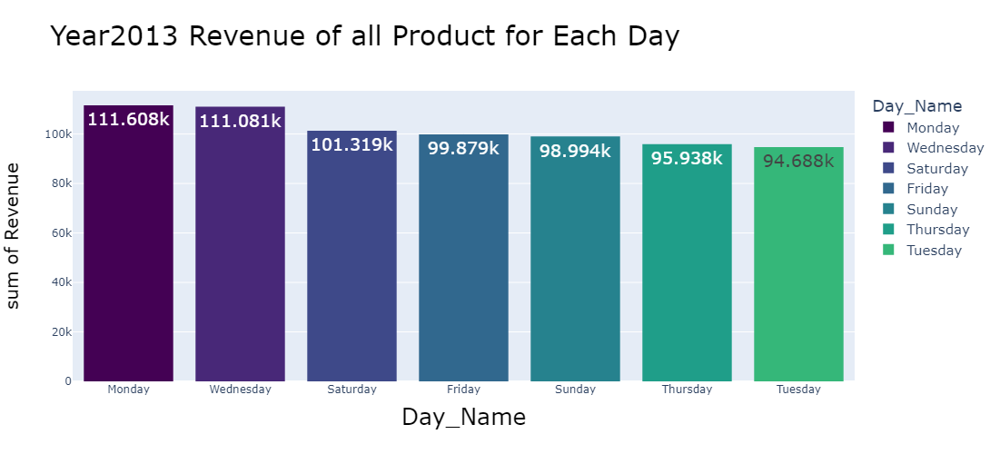

In [145]:
fig = px.histogram(data_frame=df_sorted,x='day_name',y='total_revenue',title='Year2013 Revenue of all Product for Each Day',
             labels={ 'total_revenue': 'Revenue','day_name':'Day_Name'},height=500,width=900,color='day_name',
                 color_discrete_sequence=px.colors.sequential.Viridis,text_auto=True)
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))

### What are the Total Revenue for all Product in Each season of Year 2013?

In [146]:
total_revenue_season = msk1.groupby('season')['total_revenue'].sum().reset_index().round(0)
df_sorted=total_revenue_season.sort_values(by='total_revenue', ascending = False)
df_sorted

,season,total_revenue
1,Spring,198411.0
3,Winter,189685.0
0,Fall,171799.0
2,Summer,153612.0


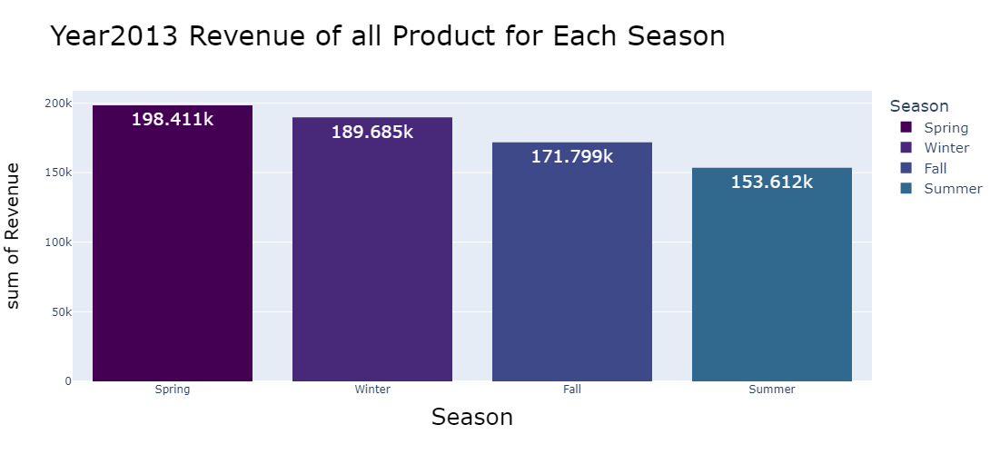

In [147]:
fig = px.histogram(data_frame=df_sorted,x='season',y='total_revenue',title='Year2013 Revenue of all Product for Each Season',
             labels={ 'total_revenue': 'Revenue','season':'Season'},height=500,width=900,color='season',
                 color_discrete_sequence=px.colors.sequential.Viridis,text_auto=True)
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))

### Quarter(1) Recorded the highest Revenue in Year 2013 , What is the specific Month that Recorded the Highest Revenue Also?

In [148]:
filtered_data=msk1[msk1['quarter']==1] 
filtered_data

,id,education,marital_status,income$,kidhome,teenhome,mntwines,mntfruits,mntmeatproducts,mntfishproducts,...,month_name,day,day_name,quarter,weekday,week_categories,season,days_of_purchases,grouped_age,total_revenue
21,115,Master,Single,43456.0,0,1,275.0,11.0,68.0,25.0,...,March,26,Tuesday,1,1,WorkDay,Spring,Top Sellers,51-60,393.0
22,10470,Master,Married,40662.0,1,0,40.0,2.0,23.0,0.0,...,March,15,Friday,1,4,WorkDay,Spring,Top Sellers,41-50,92.0
23,4065,PhD,Married,49544.0,1,0,308.0,0.0,73.0,0.0,...,February,12,Tuesday,1,1,WorkDay,Winter,Top Sellers,41-50,404.0
41,7030,PhD,Married,66465.0,0,1,1200.0,0.0,204.0,38.0,...,March,30,Saturday,1,5,WeekEnd,Spring,Top Sellers,61-70,1485.0
42,1524,2n Cycle,Single,81698.0,0,0,709.0,45.0,115.0,30.0,...,March,1,Friday,1,4,WorkDay,Spring,Top Sellers,41-50,1104.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2191,3032,Graduation,Married,24570.0,1,0,28.0,34.0,62.0,11.0,...,February,27,Wednesday,1,2,WorkDay,Winter,Very Old,31-40,193.0
2192,5153,PhD,Married,77766.0,0,1,1004.0,59.0,265.0,115.0,...,February,22,Friday,1,4,WorkDay,Winter,Very Old,51-60,1529.0
2193,4127,PhD,Married,77766.0,0,1,1004.0,59.0,265.0,115.0,...,February,22,Friday,1,4,WorkDay,Winter,Very Old,51-60,1529.0
2231,10142,PhD,Divorced,66476.0,0,1,372.0,18.0,126.0,47.0,...,March,7,Thursday,1,3,WorkDay,Spring,Very Old,41-50,689.0


In [149]:
df['total_revenue'] = df[product_columns].sum(axis=1)

In [150]:
total_revenue_month = filtered_data.groupby('month_name')['total_revenue'].sum().reset_index().round(0)
df_sorted=total_revenue_month.sort_values(by='total_revenue', ascending = False)
df_sorted

,month_name,total_revenue
1,January,71351.0
0,February,68879.0
2,March,67322.0


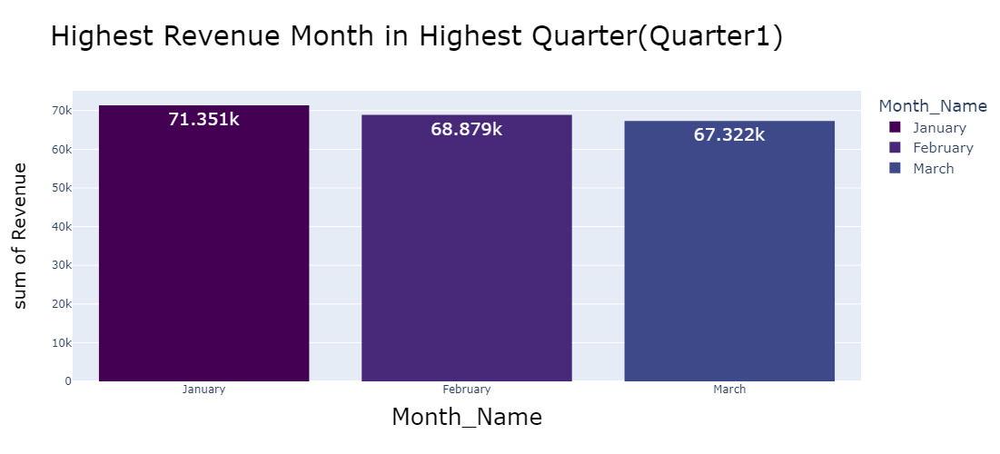

In [151]:
fig = px.histogram(data_frame=df_sorted,x='month_name',y='total_revenue',title='Highest Revenue Month in Highest Quarter(Quarter1)',
             labels={ 'total_revenue': 'Revenue','month_name':'Month_Name'},height=500,width=900,color='month_name',
                 color_discrete_sequence=px.colors.sequential.Viridis,text_auto=True)
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))

In [152]:
product_columns = ['mntwines', 'mntfruits', 'mntmeatproducts', 'mntfishproducts', 'mntsweetproducts', 'mntgoldprods']

In [153]:
revenue_quarter1=filtered_data.groupby('quarter')[product_columns].sum().reset_index().round(0)
revenue_quarter1

,quarter,mntwines,mntfruits,mntmeatproducts,mntfishproducts,mntsweetproducts,mntgoldprods
0,1,105765.0,9509.0,53995.0,13000.0,9212.0,16071.0


In [154]:
total_spent_long = pd.melt(revenue_quarter1, id_vars=('quarter'), var_name='product', value_name='revenue')
df_sorted=total_spent_long.sort_values(by='revenue',ascending = False)
df_sorted

,quarter,product,revenue
0,1,mntwines,105765.0
2,1,mntmeatproducts,53995.0
5,1,mntgoldprods,16071.0
3,1,mntfishproducts,13000.0
1,1,mntfruits,9509.0
4,1,mntsweetproducts,9212.0


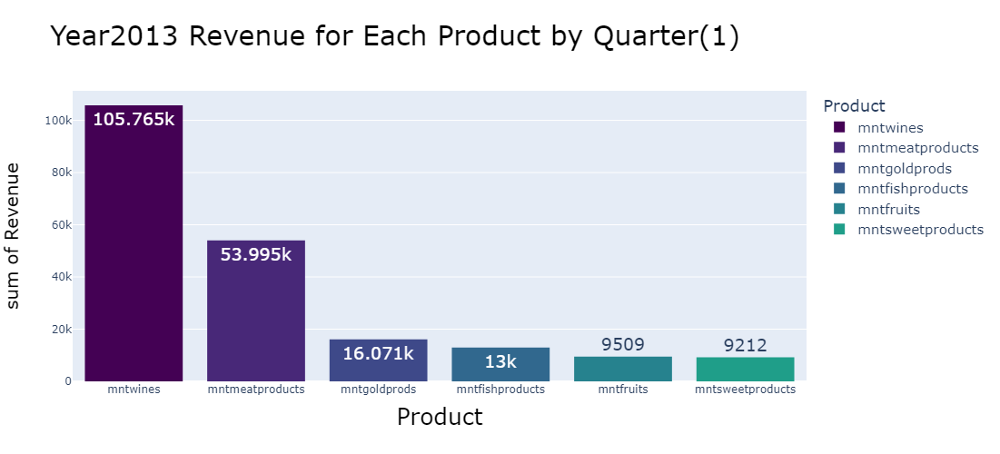

In [155]:
fig = px.histogram(data_frame=df_sorted,x='product',y='revenue',title='Year2013 Revenue for Each Product by Quarter(1)',
             labels={ 'revenue': 'Revenue','product':'Product'},height=500,width=900,color='product',
                 color_discrete_sequence=px.colors.sequential.Viridis,text_auto=True)
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))

### What is the Highest day of revenue for highest Month ?

In [156]:
filter2=filtered_data[filtered_data['month_name']=="January"]
filter2

,id,education,marital_status,income$,kidhome,teenhome,mntwines,mntfruits,mntmeatproducts,mntfishproducts,...,month_name,day,day_name,quarter,weekday,week_categories,season,days_of_purchases,grouped_age,total_revenue
45,9595,Graduation,Together,64260.0,0,0,539.0,169.0,816.0,20.0,...,January,11,Friday,1,4,WorkDay,Winter,Top Sellers,61-70,1574.0
46,3158,Graduation,Married,32300.0,1,0,13.0,3.0,6.0,6.0,...,January,3,Thursday,1,3,WorkDay,Winter,Top Sellers,51-60,39.0
70,1772,PhD,Married,79174.0,0,0,1074.0,37.0,518.0,193.0,...,January,11,Friday,1,4,WorkDay,Winter,Top Sellers,41-50,2043.0
71,5341,2n Cycle,Divorced,81975.0,0,1,983.0,76.0,184.0,180.0,...,January,5,Saturday,1,5,WeekEnd,Winter,Top Sellers,61-70,1588.0
100,6715,PhD,Single,60200.0,0,1,502.0,19.0,132.0,0.0,...,January,2,Wednesday,1,2,WorkDay,Winter,Top Sellers,71-80,685.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2101,6988,Graduation,Married,71952.0,1,0,656.0,80.0,455.0,52.0,...,January,10,Thursday,1,3,WorkDay,Winter,Very Old,31-40,1443.0
2125,9553,Graduation,Married,7500.0,0,0,0.0,2.0,3.0,4.0,...,January,9,Wednesday,1,2,WorkDay,Winter,Very Old,31-40,15.0
2147,999,Graduation,Single,86037.0,0,0,490.0,44.0,125.0,29.0,...,January,2,Wednesday,1,2,WorkDay,Winter,Very Old,31-40,730.0
2171,3270,2n Cycle,Together,17117.0,1,0,12.0,23.0,38.0,30.0,...,January,17,Thursday,1,3,WorkDay,Winter,Very Old,41-50,128.0


In [157]:
df['total_revenue'] = df[product_columns].sum(axis=1)

In [158]:
total_spend_day=filter2.groupby('day_name')['total_revenue'].sum().reset_index().round(0)
df_sorted=total_spend_day.sort_values(by='total_revenue',ascending = False)
df_sorted

,day_name,total_revenue
6,Wednesday,14431.0
0,Friday,12956.0
4,Thursday,11848.0
2,Saturday,10581.0
3,Sunday,10403.0
5,Tuesday,7926.0
1,Monday,3206.0


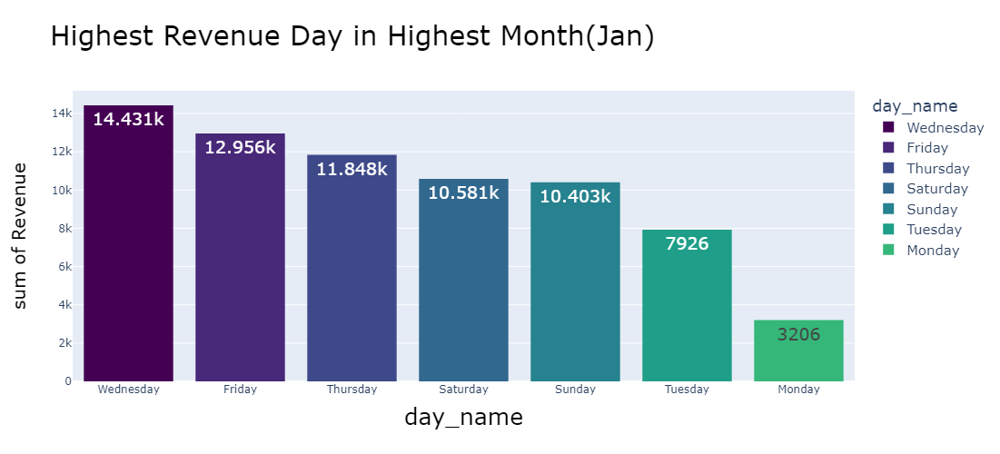

In [159]:
fig = px.histogram(data_frame=df_sorted,x='day_name',y='total_revenue',title='Highest Revenue Day in Highest Month(Jan)',
             labels={ 'total_revenue': 'Revenue','month_name':'Month_Name'},height=500,width=900,color='day_name',
                 color_discrete_sequence=px.colors.sequential.Viridis,text_auto=True)
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))

### What are the numbers of Customers in Each category of last_Purchases made in days?

In [223]:
df_sorted=df.groupby('days_of_purchases').size().reset_index(name='count_of_days').sort_values(by='count_of_days',ascending = False)
df_sorted

,days_of_purchases,count_of_days
4,Very Old,670
1,Not Recent,447
0,Moderately Recent,429
2,Recent,320
5,Very Recent,187
3,Top Sellers,183


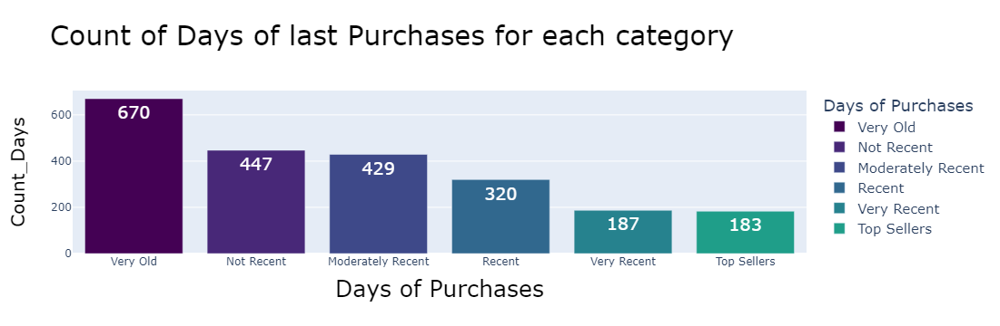

In [226]:
fig = px.bar(df_sorted, x='days_of_purchases', y='count_of_days', color='days_of_purchases',
             labels={'days_of_purchases': 'Days of Purchases', 'count_of_days': 'Count_Days'},text_auto=True,
             title='Count of Days of last Purchases for each category',color_discrete_sequence=px.colors.sequential.Viridis)
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))
fig.show()

### What are the details of Top_seller for our Company?

In [244]:
Top_Seller=df[df['days_of_purchases']=='Top Sellers']
Top_Seller

,id,education,marital_status,income$,kidhome,teenhome,mntwines,mntfruits,mntmeatproducts,mntfishproducts,...,month_name,day,day_name,quarter,weekday,week_categories,season,days_of_purchases,grouped_age,total_revenue
0,1826,Graduation,Divorced,84835.0,0,0,189.0,104.0,379.0,111.0,...,June,16,Monday,2,0,WorkDay,Summer,Top Sellers,51-60,1190.0
1,1,Graduation,Single,57091.0,0,0,464.0,5.0,64.0,7.0,...,June,15,Sunday,2,6,WeekEnd,Summer,Top Sellers,61-70,577.0
2,10476,Graduation,Married,67267.0,0,1,134.0,11.0,59.0,15.0,...,May,13,Tuesday,2,1,WorkDay,Spring,Top Sellers,61-70,251.0
3,1386,Graduation,Together,32474.0,1,1,10.0,0.0,1.0,0.0,...,May,11,Sunday,2,6,WeekEnd,Spring,Top Sellers,51-60,11.0
4,5371,Graduation,Single,21474.0,1,0,6.0,16.0,24.0,11.0,...,April,8,Tuesday,2,1,WorkDay,Spring,Top Sellers,31-40,91.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
178,10659,2n Cycle,Together,7500.0,1,0,2.0,8.0,11.0,3.0,...,May,7,Tuesday,2,1,WorkDay,Spring,Top Sellers,41-50,53.0
179,10905,Graduation,Together,42586.0,1,1,194.0,2.0,56.0,0.0,...,October,29,Monday,4,0,WorkDay,Fall,Top Sellers,61-70,252.0
180,8910,Graduation,Together,42586.0,1,1,194.0,2.0,56.0,0.0,...,October,29,Monday,4,0,WorkDay,Fall,Top Sellers,61-70,252.0
181,7349,Basic,Together,9722.0,1,0,6.0,17.0,16.0,6.0,...,October,2,Tuesday,4,1,WorkDay,Fall,Top Sellers,51-60,103.0


In [253]:
Top_seller_summary = Top_Seller.groupby('marital_status').size().reset_index(name='count_of_Customers').sort_values(by='count_of_Customers', ascending = False)
Top_seller_summary

,marital_status,count_of_Customers
1,Married,78
3,Single,42
4,Together,42
0,Divorced,15
5,Widow,5
2,Other,1


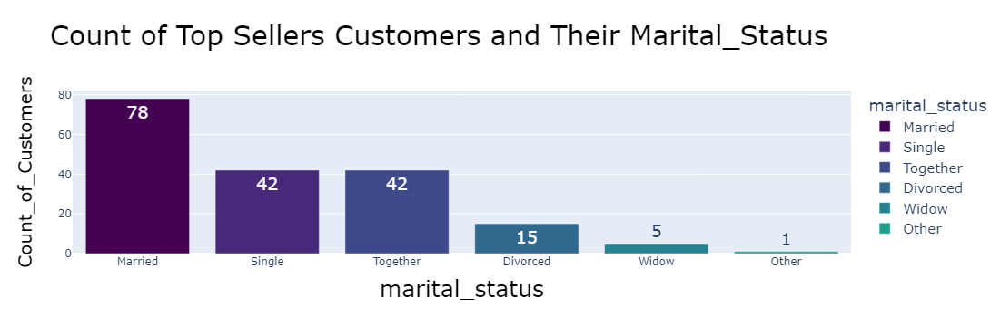

In [254]:
fig = px.bar(Top_seller_summary, x='marital_status', y='count_of_Customers',
             labels={'marital_status': 'marital_status', 'count_of_Customers': 'Count_of_Customers'},color='marital_status',
             title='Count of Top Sellers Customers and Their Marital_Status',text_auto=True,color_discrete_sequence=px.colors.sequential.Viridis)
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))
fig.show()

In [255]:
Top_seller_summary = Top_Seller.groupby('education').size().reset_index(name='count_of_Customers').sort_values(by='count_of_Customers', ascending = False)
Top_seller_summary

,education,count_of_Customers
2,Graduation,83
3,Master,39
4,PhD,38
0,2n Cycle,18
1,Basic,5


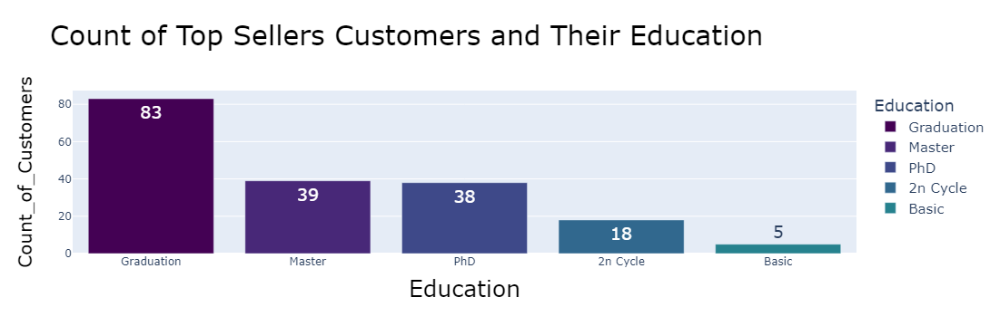

In [256]:
fig = px.bar(Top_seller_summary, x='education', y='count_of_Customers',
             labels={'education': 'Education', 'count_of_Customers': 'Count_of_Customers'},color='education',
             title='Count of Top Sellers Customers and Their Education',text_auto=True,color_discrete_sequence=px.colors.sequential.Viridis)
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))
fig.show()

In [257]:
Top_seller_summary = Top_Seller.groupby('grouped_age').size().reset_index(name='count_of_Customers').sort_values(by='count_of_Customers', ascending = False)
Top_seller_summary

,grouped_age,count_of_Customers
3,61-70,52
2,51-60,50
1,41-50,44
0,31-40,23
4,71-80,14


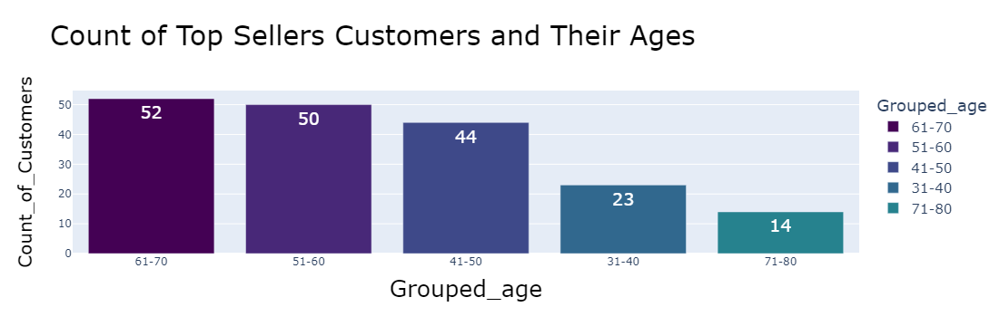

In [258]:
fig = px.bar(Top_seller_summary, x='grouped_age', y='count_of_Customers',
             labels={'grouped_age': 'Grouped_age', 'count_of_Customers': 'Count_of_Customers'},color='grouped_age',
             title='Count of Top Sellers Customers and Their Ages',text_auto=True,color_discrete_sequence=px.colors.sequential.Viridis)
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))
fig.show()

In [259]:
Top_seller_summary = Top_Seller.groupby('country').size().reset_index(name='count_of_Customers').sort_values(by='count_of_Customers', ascending = False)
Top_seller_summary

,country,count_of_Customers
6,SP,94
1,CA,18
5,SA,17
3,IND,16
0,AUS,14
2,GER,14
7,US,9
4,ME,1


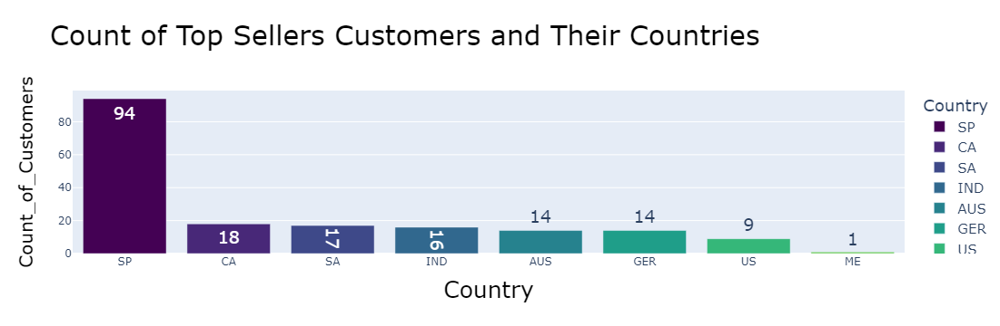

In [260]:
fig = px.bar(Top_seller_summary, x='country', y='count_of_Customers',
             labels={'country': 'Country', 'count_of_Customers': 'Count_of_Customers'},color='country',
             title='Count of Top Sellers Customers and Their Countries',text_auto=True,color_discrete_sequence=px.colors.sequential.Viridis)
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))
fig.show()

###  What are the Details of Customers that response with Yes to Offers of the Last Campaign?

In [261]:
responses_yes = df[df['response'] == 1]
responses_yes

,id,education,marital_status,income$,kidhome,teenhome,mntwines,mntfruits,mntmeatproducts,mntfishproducts,...,month_name,day,day_name,quarter,weekday,week_categories,season,days_of_purchases,grouped_age,total_revenue
0,1826,Graduation,Divorced,84835.0,0,0,189.0,104.0,379.0,111.0,...,June,16,Monday,2,0,WorkDay,Summer,Top Sellers,51-60,1190.0
1,1,Graduation,Single,57091.0,0,0,464.0,5.0,64.0,7.0,...,June,15,Sunday,2,6,WeekEnd,Summer,Top Sellers,61-70,577.0
4,5371,Graduation,Single,21474.0,1,0,6.0,16.0,24.0,11.0,...,April,8,Tuesday,2,1,WorkDay,Spring,Top Sellers,31-40,91.0
5,7348,PhD,Single,71691.0,0,0,336.0,130.0,411.0,240.0,...,March,17,Monday,1,0,WorkDay,Spring,Top Sellers,61-70,1192.0
6,4073,2n Cycle,Married,63564.0,0,0,769.0,80.0,252.0,15.0,...,January,29,Wednesday,1,2,WorkDay,Winter,Top Sellers,61-70,1215.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2192,5153,PhD,Married,77766.0,0,1,1004.0,59.0,265.0,115.0,...,February,22,Friday,1,4,WorkDay,Winter,Very Old,51-60,1529.0
2193,4127,PhD,Married,77766.0,0,1,1004.0,59.0,265.0,115.0,...,February,22,Friday,1,4,WorkDay,Winter,Very Old,51-60,1529.0
2209,3979,PhD,Divorced,90687.0,0,0,982.0,17.0,672.0,23.0,...,May,22,Wednesday,2,2,WorkDay,Spring,Very Old,41-50,1779.0
2213,7230,PhD,Divorced,50611.0,0,1,459.0,0.0,24.0,6.0,...,October,4,Thursday,4,3,WorkDay,Fall,Very Old,61-70,493.0


In [228]:
responses_summary = responses_yes.astype(str).groupby('marital_status').size().reset_index(name='count_of_yes_responses')
responses_summary

,marital_status,count_of_yes_responses
0,Divorced,48
1,Married,98
2,Other,3
3,Single,106
4,Together,60
5,Widow,19


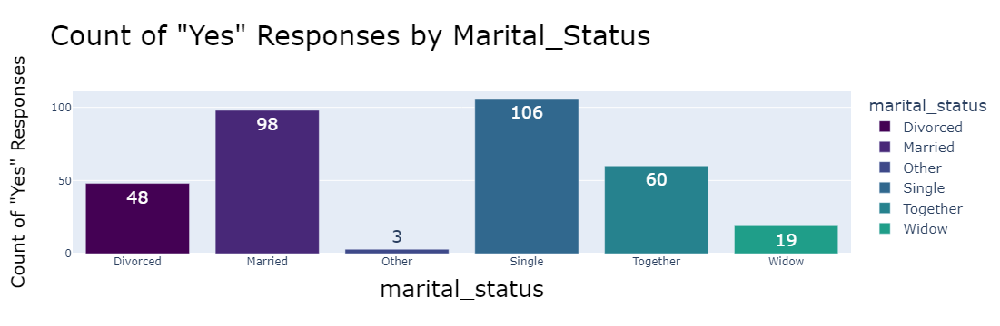

In [229]:
fig = px.bar(responses_summary, x='marital_status', y='count_of_yes_responses',
             labels={'marital_status': 'marital_status', 'count_of_yes_responses': 'Count of "Yes" Responses'},color='marital_status',
             title='Count of "Yes" Responses by Marital_Status',text_auto=True,color_discrete_sequence=px.colors.sequential.Viridis)
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))
fig.show()

In [176]:
responses_summary = responses_yes.astype(str).groupby('education').size().reset_index(name='count_of_yes_responses')
responses_summary

,education,count_of_yes_responses
0,2n Cycle,22
1,Basic,2
2,Graduation,152
3,Master,57
4,PhD,101


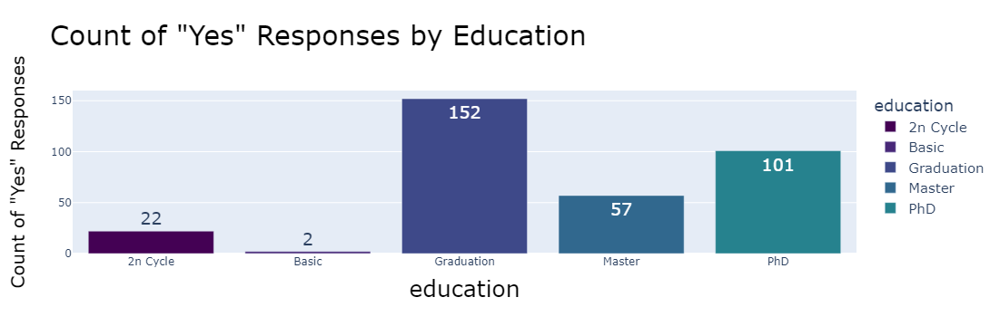

In [177]:
fig = px.bar(responses_summary, x='education', y='count_of_yes_responses',
             labels={'education': 'education', 'count_of_yes_responses': 'Count of "Yes" Responses'},color='education',
             title='Count of "Yes" Responses by Education',text_auto=True,color_discrete_sequence=px.colors.sequential.Viridis)
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))
fig.show()

### What are the Highest Ages who Responses with "yes" for the Last Campaign?

In [230]:
responses_summary = responses_yes.astype(str).groupby('grouped_age').size().reset_index(name='count_of_yes_responses')
responses_summary

,grouped_age,count_of_yes_responses
0,20-30,3
1,31-40,44
2,41-50,84
3,51-60,95
4,61-70,65
5,71-80,40
6,81-90,3


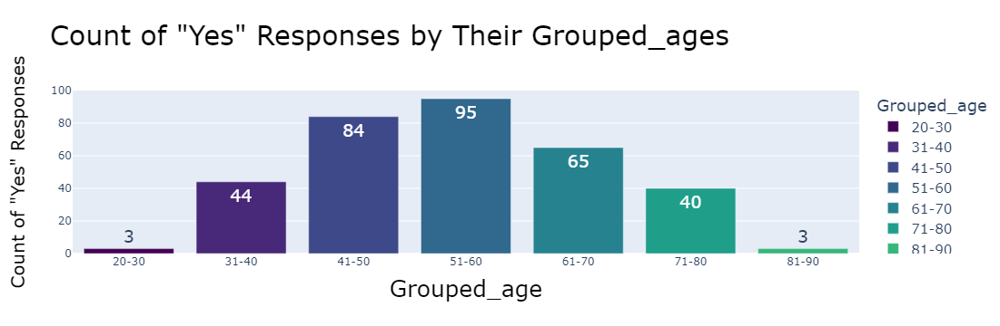

In [231]:
fig = px.bar(responses_summary, x='grouped_age', y='count_of_yes_responses',
             labels={'grouped_age': 'Grouped_age', 'count_of_yes_responses': 'Count of "Yes" Responses'},color='grouped_age',
             title='Count of "Yes" Responses by Their Grouped_ages',text_auto=True,color_discrete_sequence=px.colors.sequential.Viridis)
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))
fig.show()

In [264]:
responses_summary = responses_yes.astype(str).groupby('country').size().reset_index(name='count_of_yes_responses').sort_values(by='count_of_yes_responses', ascending = False)
responses_summary

,country,count_of_yes_responses
6,SP,176
5,SA,52
1,CA,38
0,AUS,23
2,GER,17
3,IND,13
7,US,13
4,ME,2


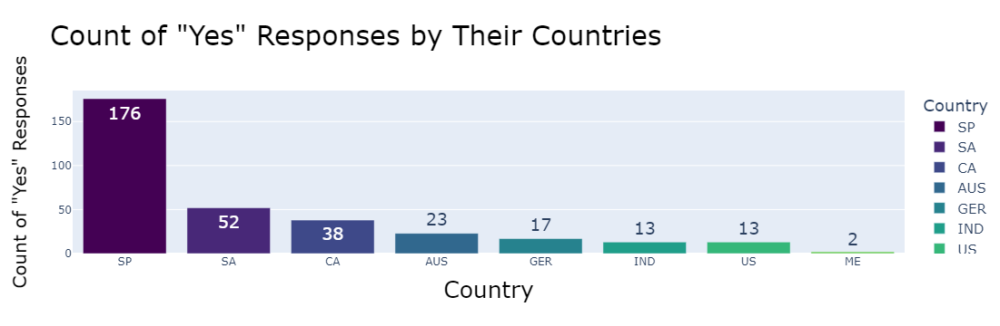

In [266]:
fig = px.bar(responses_summary, x='country', y='count_of_yes_responses',
             labels={'country': 'Country', 'count_of_yes_responses': 'Count of "Yes" Responses'},color='country',
             title='Count of "Yes" Responses by Their Countries',text_auto=True,color_discrete_sequence=px.colors.sequential.Viridis)
fig.update_traces(textfont_size=19)
fig.update_layout(title_font=dict(size=30, color='black'),xaxis_title_font=dict(size=25, color='black'),legend=dict(font=dict(size=15)),
                  yaxis_title_font=dict(size=20, color='black'))
fig.show()